# **This is the classification model for income classification dataset**

**This model is used for classifing the income**

In [1]:
!pip install smote

In [2]:
!pip install catboost

     |████████████████████████████████| 76.1 MB 1.1 MB/s 


In [3]:
!pip install costcla

     |████████████████████████████████| 4.0 MB 4.2 MB/s 
  Created wheel for pyea: filename=pyea-0.2-py3-none-any.whl size=6018 sha256=8fb8e06f44b2848a55b59e1ae9aa2e4726477270f51d1a9051f32f86c1f7b26e
  Stored in directory: /root/.cache/pip/wheels/c4/c7/f9/c43bd31860d7235d875091659066bf793ea300fd0621156737
Successfully built pyea


In [117]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
sns.set(style="darkgrid")

In [118]:
#generate your dataset
def generate_data(location:str,sample_number=10):
  data=pd.read_csv(location,engine='python')
  head=data.head()
  tail=data.tail()
  sample=data.sample(sample_number)
  description=data.describe()
  columns=data.columns
  info=data.info()
  shape=data.shape
  size=data.size
  return_data = {'data':data,'head':head,'tail':tail,'sample':sample,'description':description,'columns':columns,'info':info,
          'shape':shape,'size':size}
  return return_data


In [119]:
data_set=generate_data('/content/income_evaluation.csv')
data=data_set['data']

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              32561 non-null  int64 
 1    workclass       32561 non-null  object
 2    fnlwgt          32561 non-null  int64 
 3    education       32561 non-null  object
 4    education-num   32561 non-null  int64 
 5    marital-status  32561 non-null  object
 6    occupation      32561 non-null  object
 7    relationship    32561 non-null  object
 8    race            32561 non-null  object
 9    sex             32561 non-null  object
 10   capital-gain    32561 non-null  int64 
 11   capital-loss    32561 non-null  int64 
 12   hours-per-week  32561 non-null  int64 
 13   native-country  32561 non-null  object
 14   income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [120]:
data_set['head']

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [8]:
data_set['tail']

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
32560,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [9]:
data_set['sample']

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
7759,41,Private,49654,HS-grad,9,Divorced,Adm-clerical,Unmarried,White,Female,0,0,52,United-States,<=50K
29918,50,Local-gov,234143,Masters,14,Married-civ-spouse,Exec-managerial,Husband,Black,Male,0,0,45,United-States,>50K
9543,27,Private,244315,HS-grad,9,Divorced,Craft-repair,Other-relative,Other,Male,0,0,40,United-States,<=50K
9257,19,Without-pay,344858,HS-grad,9,Never-married,Farming-fishing,Own-child,White,Male,0,0,20,United-States,<=50K
17336,55,Private,236520,Assoc-voc,11,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States,>50K
23384,31,Federal-gov,166626,HS-grad,9,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,40,United-States,>50K
6606,48,Private,240629,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,Italy,>50K
25933,38,Private,102945,Bachelors,13,Married-civ-spouse,Sales,Husband,White,Male,0,0,52,United-States,>50K
20106,52,Private,38795,HS-grad,9,Divorced,Craft-repair,Not-in-family,White,Male,0,0,40,United-States,>50K
12566,44,Private,156413,Some-college,10,Married-civ-spouse,Tech-support,Husband,White,Male,0,0,44,United-States,>50K


In [10]:
data_set['description']

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [121]:
data.columns

Index(['age', ' workclass', ' fnlwgt', ' education', ' education-num',
       ' marital-status', ' occupation', ' relationship', ' race', ' sex',
       ' capital-gain', ' capital-loss', ' hours-per-week', ' native-country',
       ' income'],
      dtype='object')

In [ ]:
#distributions of features
px.histogram(data,'age',color='age')

In [ ]:
px.histogram(data,' workclass',color=' workclass')

In [ ]:
px.histogram(data,' fnlwgt',color=' fnlwgt')

In [ ]:
px.histogram(data,' education-num',color=' education-num')

In [ ]:
px.histogram(data,' marital-status',color=' marital-status')

In [ ]:
px.histogram(data,' occupation',color=' occupation')

In [ ]:
px.histogram(data,' relationship',color=' relationship')

In [ ]:
px.histogram(data,' race',color=' race')

In [ ]:
px.histogram(data,' sex',color=' sex')

In [ ]:
px.histogram(data,' hours-per-week',color=' hours-per-week')

In [ ]:
px.histogram(data,' capital-loss',color=' capital-loss')

In [ ]:
px.histogram(data,' capital-gain',color=' capital-gain')

In [ ]:
px.histogram(data,' native-country',color=' native-country')

In [ ]:
px.histogram(data,' income',color=' income')

#correlation map before ant sort of preprocessing

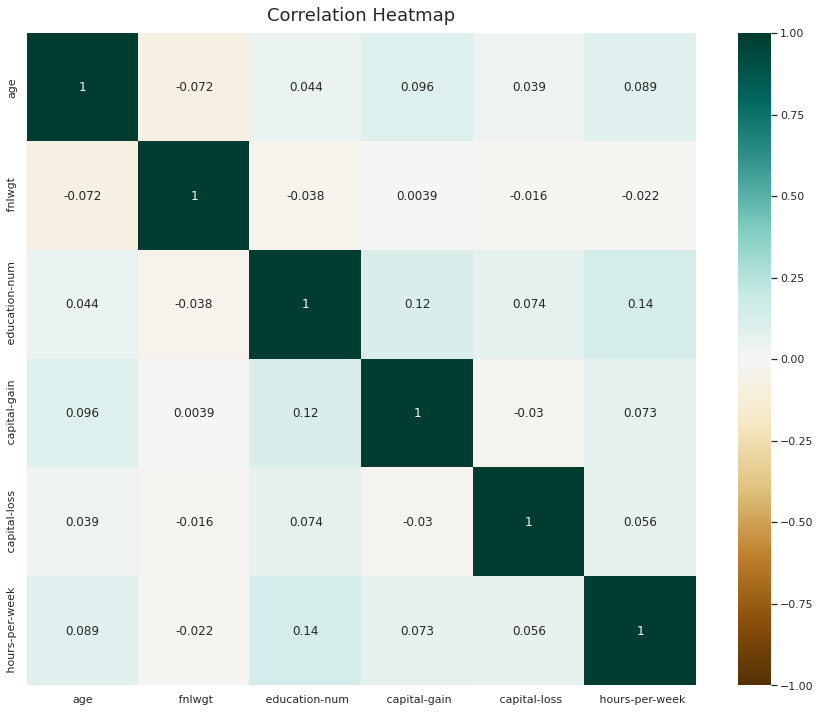

In [ ]:
create_heat_map(data1)

#Preprocessing data

In [122]:
#since the data is requring memmory which is aukaat ke bahar therfore spliting dataset into two halves
data1=data.iloc[0:15000,:]
data2=data.iloc[15000:30000,:]
data3=data.iloc[30000:45000,:]
data4=data.iloc[45000:-1,:]

In [123]:
def create_heat_map(data,x:int=15,y:int=12):
  #correalation between varaibles
  plt.figure(figsize=(15, 12))
  heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
  heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
  # save heatmap as .png file
  # dpi - sets the resolution of the saved image in dots/inches
  # bbox_inches - when set to 'tight' - does not allow the labels to be cropped
  plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')# this will will also return two dataset one being the original one and second one will be the one in


In [124]:
def get_type(data):
  numeric=[]
  categorical=[]
  for col in data.columns:
    if data[f'{col}'].dtypes == 'object':
      categorical.append(col)
    else:
      numeric.append(col)
  return {'numeric':numeric,'categorical':categorical}

In [125]:
# check for null values and deal with them
# this function will take the type of process as well for both numeric and categorical data
def treat_null_values(data,numeric_type:str='mean'):
  types=get_type(data)
  numeric=types['numeric']
  categorical=types['categorical']
  if numeric_type == 'mean':
    for col in numeric:
      data[f'{col}']=data[f'{col}'].fillna(data[f'{col}'].mean())
  elif numeric_type == 'mode':
    for col in numeric:
      data[f'{col}']=data[f'{col}'].fillna(data[f'{col}'].mode())
  elif numeric_type == 'median':
    for col in numeric:
      data[f'{col}']=data[f'{col}'].fillna(data[f'{col}'].median())
  elif numeric_type == 'frequent':
    for col in numeric:
      data[f'{col}']=data[f'{col}'].fillna(data[f'{col}'].nunique[0])
  elif numeric_type == 'drop':
    for col in numeric:
      data[f'{col}']=data[f'{col}'].dropnna(inplace=True)
  elif numeric_type == 'predictive_modeling':
    pass # create a seprate function for this
  elif numeric_type == 'impute':
    pass # create a seprate function for this as well
  
  for col in categorical:
    most_frequent_category=data[f'{col}'].mode()[0]
    data[f'{col}'].fillna(most_frequent_category,inplace=True)
  return data

  

def predictive_modeling():
  pass #do a detailed study as disadvantages for this model usually outweights advantages
def multiple_imputation():
  from fancyimpute import IterativeImputer as MICE
  data= pd.DataFrame(MICE().fit_transform(data))
  return data

In [126]:
def encode_data(data,multiclass:str='One_hot',binary_class:str='Label'): #this function takes three args one is the data 2nd is the type of encoding for multiclass data and third is the encoding for binary class data
  categorical=get_type(data)['categorical']
  multivariate=[]
  bivariate=[]
  for col in categorical:
    if data[f'{col}'].nunique()>2:
      multivariate.append(col)
    else:
      bivariate.append(col)
  
  if multiclass == 'One_hot':
    for col in multivariate:
      data=encode_and_bind(data,col)
  if binary_class == 'Label':
    for col in bivariate:
      data=label_encode(data,col)
  # add other sorting techniques as well in here
  return data

def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res.pop(feature_to_encode)
    return(res)

def label_encode(data,col):
  from sklearn.preprocessing import LabelEncoder
  encoder=LabelEncoder()
  data[col]=encoder.fit_transform(data[col])
  return data
  
# this function needs to be modified therefore add differenr sort of encoding techniques as well in this cll

In [127]:
def treat_outliers(data,feature:str,algo:str='IQR',z_threshold:int=3,add_feature=None,remove:bool=False,scatter:bool=False,feature_x=None,feature_y=None): # this function takes two arguments one is data and 2ns is the algorithm
  pass
  if scatter == True:
    px.scatter(data_px,x=feature_x,y=feature_y,hover_name='Country')
  else:
    if algo == 'IQR':
      outlier_index=Inter_quantile_range(data,feature)
    if algo == 'EEA': # elliptic envelope algo
      outlier_index=Elliptice_envelope_algo(data,feature,add_feature)
    if algo == 'ISF': # Isolate forest algo
      outlier_index=Isolate_forest_algo(data,feature)
    if algo == 'One_classSVM': # one class svm
      outlier_index=One_class_SVM(data,feature)
    if algo == 'LOF':
      outlier_index=Local_factor_outlier(data,feature)
    if algo == 'Z_score':
      outlier_index=Z_score_algo(data,feature,z_threshold)
    print(outlier_index)
    if remove == True:
      data=remove_outliers(outlier_index,data)
    
    return data
    


# in all these function display the index of outliers

def Local_factor_outlier(data,feature):
  import numpy as np 
  from sklearn.neighbors import LocalOutlierFactor
  X=data[[feature,data.columns.values[-1]]]
  lof = LocalOutlierFactor(n_neighbors=20, algorithm='auto',
                         metric='minkowski', contamination=0.04,
                         novelty=False, n_jobs=-1)
  pred = lof.fit_predict(X)
  outlier_index = np.where(pred==-1)
  return outlier_index

def One_class_SVM(data,feature): #this returns novelty I am guessing so fuck this method
  import numpy as np
  from sklearn.svm import OneClassSVM
  X=data[[feature,data.columns.values[-1]]]
  one_class_svm = OneClassSVM(kernel='rbf', degree=3, gamma='scale')
  new_data = np.array([[-4, 8.5]])# change these values as per your dataset
  one_class_svm.fit(X)
  pred = one_class_svm.predict(new_data)
  outlier_index = np.where(pred==-1)
  return outlier_index

def Isolate_forest_algo(data,feature):
  import numpy as np
  from sklearn.ensemble import IsolationForest
  from sklearn.decomposition import PCA
  from sklearn.preprocessing import StandardScaler
  X=data[[feature,data.columns.values[-1]]]
   # Returns 1 of inliers, -1 for outliers
  iforest = IsolationForest(n_estimators=100, max_samples='auto', 
                          contamination=0.05, max_features=1.0, 
                          bootstrap=False, n_jobs=-1, random_state=1)
  pred = iforest.fit_predict(X)
 # Extract outliers
  outlier_index = np.where(pred==-1)
  return outlier_index

def Elliptice_envelope_algo(data,feature,add_feature):
  import numpy as np
  from sklearn.covariance import EllipticEnvelope
  elpenv = EllipticEnvelope(contamination=0.025, 
                          random_state=1)
  X=data[[feature,add_feature]]
# Returns 1 of inliers, -1 for outliers
  pred = elpenv.fit_predict(X)

# Extract outliers
  outlier_index = np.where(pred==-1)
  return outlier_index

def Inter_quantile_range(data,feature):
  Q1 = np.percentile(data[f'{feature}'], 25, interpolation = 'midpoint') 
  Q2 = np.percentile(data[f'{feature}'], 50, interpolation = 'midpoint') 
  Q3 = np.percentile(data[f'{feature}'], 75, interpolation = 'midpoint') 
  IQR = Q3 - Q1 
  low_lim = Q1 - 1.5 * IQR
  up_lim = Q3 + 1.5 * IQR
  outlier_index=[]
  for val in data[f'{feature}']:
    if val > up_lim or val <low_lim:
      outlier_index.append(data.index[data[f'{feature}'] == val].values[0])
  return outlier_index
         
def Z_score_algo(data,feature,z_threshold):
  mean = np.mean(data[f'{feature}'])
  std = np.std(data[f'{feature}'])
  print('mean of the dataset is', mean)
  print('std. deviation is', std)
  outlier_index = []
  for val in data[f'{feature}']:
    z = (val-mean)/std
    if z > z_threshold:
      outlier_index.append(data.index[data[f'{feature}'] == val].values[0])
  return outlier_index
  


# this function will remove the outliers if removal is allowed
def remove_outliers(index,data):
  for row in index:
    data.drop([row])
    print(f'dropped value at index {row}')
  return data

      

# if remove is true remove outliers else if it is false just return the index of outliers
# this will function will be returning two datasets the original one and one in which all the outliers are removed



In [128]:
# this function will perform all the data preprocessing steps
# incase you want to use non default algos call these function seprately
def preprocess_data(data,feature:str):
  data=treat_null_values(data)
  data=encode_data(data)
  last_column = data[feature]
  data.drop(feature, inplace=True, axis=1)
  data.insert(data.shape[1],feature,last_column)
  
  return data

# call outliers and balance function independentlu whenever you like and PS Fuck Roopa


In [129]:
data=preprocess_data(data1,' income')
data.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,age,fnlwgt,education-num,sex,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital-status_ Divorced,marital-status_ Married-AF-spouse,marital-status_ Married-civ-spouse,marital-status_ Married-spouse-absent,marital-status_ Never-married,marital-status_ Separated,marital-status_ Widowed,occupation_ ?,...,native-country_ Canada,native-country_ China,native-country_ Columbia,native-country_ Cuba,native-country_ Dominican-Republic,native-country_ Ecuador,native-country_ El-Salvador,native-country_ England,native-country_ France,native-country_ Germany,native-country_ Greece,native-country_ Guatemala,native-country_ Haiti,native-country_ Honduras,native-country_ Hong,native-country_ Hungary,native-country_ India,native-country_ Iran,native-country_ Ireland,native-country_ Italy,native-country_ Jamaica,native-country_ Japan,native-country_ Laos,native-country_ Mexico,native-country_ Nicaragua,native-country_ Outlying-US(Guam-USVI-etc),native-country_ Peru,native-country_ Philippines,native-country_ Poland,native-country_ Portugal,native-country_ Puerto-Rico,native-country_ Scotland,native-country_ South,native-country_ Taiwan,native-country_ Thailand,native-country_ Trinadad&Tobago,native-country_ United-States,native-country_ Vietnam,native-country_ Yugoslavia,income
0,39,77516,13,1,2174,0,40,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,50,83311,13,1,0,0,13,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,38,215646,9,1,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,53,234721,7,1,0,0,40,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,28,338409,13,0,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [130]:
data.columns

Index(['age', ' fnlwgt', ' education-num', ' sex', ' capital-gain',
       ' capital-loss', ' hours-per-week', ' workclass_ ?',
       ' workclass_ Federal-gov', ' workclass_ Local-gov',
       ...
       ' native-country_ Puerto-Rico', ' native-country_ Scotland',
       ' native-country_ South', ' native-country_ Taiwan',
       ' native-country_ Thailand', ' native-country_ Trinadad&Tobago',
       ' native-country_ United-States', ' native-country_ Vietnam',
       ' native-country_ Yugoslavia', ' income'],
      dtype='object', length=107)

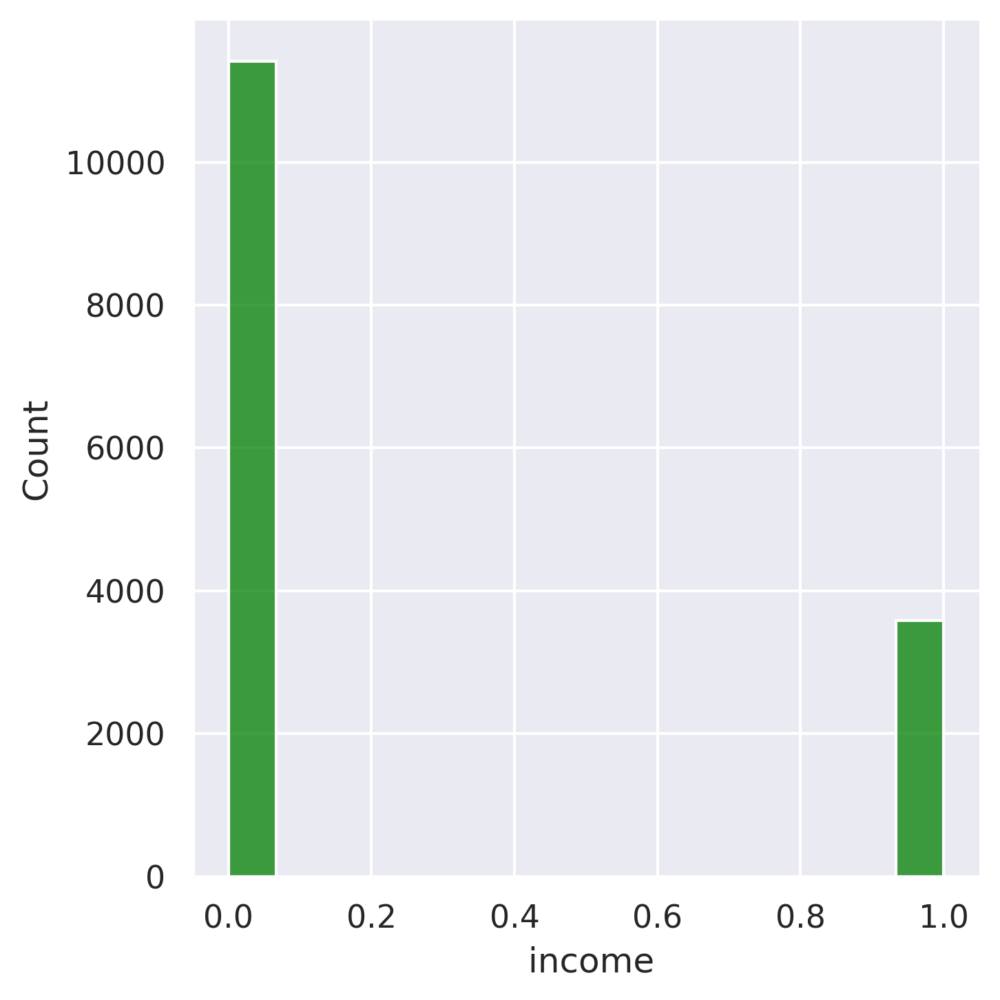

In [131]:
sns.displot(data[' income'],color='green')
#this is an imbalanaced dataset since the number of instances for class 0 is way more then
#instances for class 1

In [132]:
data.columns

Index(['age', ' fnlwgt', ' education-num', ' sex', ' capital-gain',
       ' capital-loss', ' hours-per-week', ' workclass_ ?',
       ' workclass_ Federal-gov', ' workclass_ Local-gov',
       ...
       ' native-country_ Puerto-Rico', ' native-country_ Scotland',
       ' native-country_ South', ' native-country_ Taiwan',
       ' native-country_ Thailand', ' native-country_ Trinadad&Tobago',
       ' native-country_ United-States', ' native-country_ Vietnam',
       ' native-country_ Yugoslavia', ' income'],
      dtype='object', length=107)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3

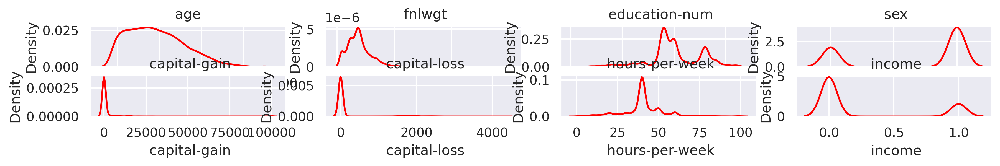

In [133]:
#studying distribution of each feature,
def study_distribution(data,dims:list,color:str='red'):
  b=4
  a=data.shape[1]/4 + 1
  c=1
  fig = plt.figure(figsize=(14,22))
  for column in dims:
    plt.subplot(a+1, b, c)
    plt.title(column)
    ax1=sns.distplot(data[column],hist=False,color=color,label=column)
    c=c+1


study_distribution(data,['age',' fnlwgt',' education-num',' sex',' capital-gain',' capital-loss',' hours-per-week',
                         ' income'])

In [ ]:
px.scatter(data,x='age',y=' fnlwgt',color=' sex',size=' hours-per-week',size_max=10,hover_name='age',
           facet_col=' income')

In [ ]:
px.scatter(data,x=' education-num',y='age',color=' sex',size=' hours-per-week',size_max=10,hover_name='age',
           facet_col=' income')

In [ ]:
px.scatter(data,x=' hours-per-week',y='age',color=' income',size=' hours-per-week',size_max=10,hover_name=' fnlwgt',
           facet_col=' sex')

In [ ]:
px.scatter(data,x=' capital-loss',y='age',color=' income',size=' capital-loss',size_max=10,hover_name='age',
           facet_col=' income')

In [ ]:
px.scatter(data,x=' capital-gain',y='age',color=' income',size=' capital-gain',size_max=10,hover_name='age',
           facet_col=' income')

In [ ]:
px.scatter(data,x=' capital-loss',y='age',color=' income',size=' capital-loss',size_max=10,hover_name='age',
           facet_col=' sex')

In [ ]:
px.scatter(data,x=' capital-gain',y='age',color=' income',size=' capital-gain',size_max=10,hover_name='age',
           facet_col=' sex')

In [ ]:
px.scatter(data,x='age',y=' education-num',color=' sex',size=' hours-per-week',
           size_max=50,hover_name=' fnlwgt',animation_frame="age",
           animation_group=' hours-per-week',log_x=False,range_x=[0,90], range_y=[0,20],facet_col=' income')

In [134]:
def SNS_distplot(feature:str,color:str='green'):
  sns.distplot(data[feature],color=color)


In [135]:
def get_type(threshold:int=75):
  val_count=data[data.columns[-1]].nunique()
  if val_count > 2:
    print("Multivariate")
    give_instances()
  elif val_count == 2:
    print("Bivaraite")
    balacing_required(75)
  else:
    print("Not enough instances for the classification")
  

# this function will basically return the instances of each class in case of multivariate and in case of bivariate yes or no based on some threshold
def balacing_required(threshold:int=75):
  count = data[data.columns[-1]].value_counts()
  class1 = count[0]
  class2 = count[1]
  if class1 >= class2:
    majority=class1
    minority=class2
  else:
    majority=class2
    minority=class1
  print(f"majority_instance:{majority} \n minority_instance:{minority}")
  if minority >= (threshold/100)*majority:
    print(f"balancing not required since minoriy is {(minority/majority)*100}% of majority")
  else:
    print(f"balancing  required since minoriy is {(minority/majority)*100}% of majority")
  SNS_distplot(data.columns[-1])

  
def give_instances():
  print(data[data.columns[-1]].value_counts())
  SNS_distplot(data.columns[-1])
  


Bivaraite
majority_instance:11412 
 minority_instance:3588
balancing  required since minoriy is 31.440588853838065% of majority


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



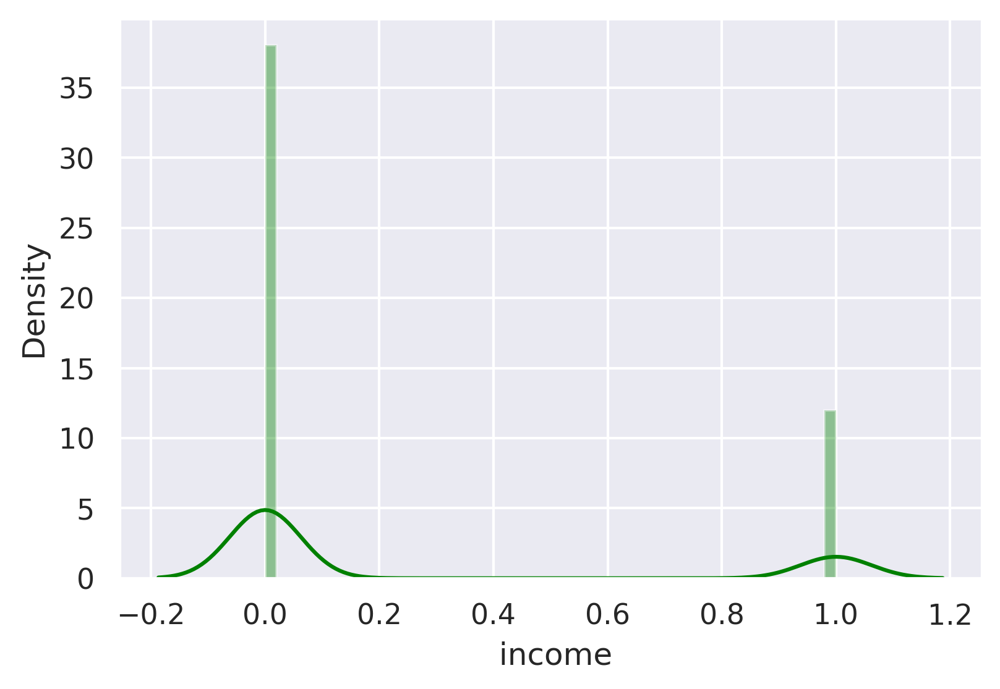

In [136]:
get_type()

In [169]:
#this function will draw a distribution of data points for us
def plot_2d_space(X, y, label='Classes'):   
  colors = ['#1F77B4', '#FF7F0E']
  markers = ['o', 's']
  plt.figure(figsize=(10,12))
  for l, c, m in zip(np.unique(y), colors, markers):
    plt.scatter(
            X[y==l, 0],
            X[y==l, 1],
            c=c, label=l, marker=m
        )
        
  plt.title(label)
  plt.legend(loc='upper right')
  plt.show()
  from sklearn.decomposition import PCA
  pca = PCA(n_components=2)
  X = pca.fit_transform(X)


def get_detailed_sampling(X,y):
  res=random_under_sampling(X,y)
  ros=random_over_sampling(X,y)
  tomek=tomek_under_sampling(X,y)
  cluster=cluster_centroid_under_sampling(X,y)
  smot = smote(X,y)
  adasyn = adaptive_synthetic_sampling(X,y)
  mixed = hybrid(X,y)

  return {'random_under_sampling':res[1],'random_over_sampling':ros[1],'tomek_under_sampling':tomek[1],
          'centroid_clustring_under_sampling':cluster[1],'smote':smot[1],'adaptive_synthetic_sampling':adasyn[1],'oversampling_then_undersampling':mixed[1]}


def draw_distribution_sampledData(X,y,color:str='blue'):
  data=get_detailed_sampling(X,y)
  plt.figure(figsize=(14,18))
  b=4
  a=4
  c=1
  for val in data:
    plt.subplot(a, b, c)
    plt.title(val)
    ax1=sns.distplot(data[val],hist=False,color=color,label=val)
    c=c+1


def random_under_sampling(X,y):
  from imblearn.under_sampling import RandomUnderSampler 
  rus = RandomUnderSampler(random_state=42)
  X_res, y_res = rus.fit_resample(X, y)
  print('Original dataset shape %s' % y.shape)
  print('Resampled dataset shape %s' % y_res.shape)
  plot_2d_space(X_res,y_res)
  return [X_res,y_res]

def random_over_sampling(X,y):
  from imblearn.over_sampling import RandomOverSampler
  ros = RandomOverSampler()
  X_ros, y_ros = ros.fit_sample(X, y)
  print(X_ros.shape[0] - X.shape[0], 'new random picked points')
  print('Original dataset shape %s' % y.shape)
  print('Resampled dataset shape %s' % y_ros.shape)
  plot_2d_space(X_ros,y_ros,'Random over sampling')
  return [X_ros,y_ros]

def tomek_under_sampling(X,y):
  from imblearn.under_sampling import TomekLinks
  tl = TomekLinks(sampling_strategy='majority')
  X_tl, y_tl= tl.fit_sample(X, y)
  print('Original dataset shape %s' % y.shape)
  print('Resampled dataset shape %s' % y_tl.shape)
  plot_2d_space(X_tl, y_tl, 'Tomek links under-sampling')
  return [X_tl,y_tl]

def cluster_centroid_under_sampling(X,y):
  from imblearn.under_sampling import ClusterCentroids
  cc = ClusterCentroids()
  X_cc, y_cc = cc.fit_sample(X, y)
  print('Original dataset shape %s' % y.shape)
  print('Resampled dataset shape %s' % y_cc.shape)
  plot_2d_space(X_cc, y_cc, 'Cluster Centroids under-sampling')
  return [X_cc,y_cc]

def smote(X,y):
  from imblearn.over_sampling import SMOTE
  X_resampled, y_resampled = SMOTE().fit_resample(X, y)
  print(X_resampled.shape[0] - X.shape[0], 'new synthetic  points')
  print('Original dataset shape %s' % y.shape)
  print('Resampled dataset shape %s' % y_resampled.shape)
  plot_2d_space(X_resampled, y_resampled, 'SMOTE over-sampling')
  return [X_resampled,y_resampled]

def adaptive_synthetic_sampling(X,y):
  from imblearn.over_sampling import ADASYN 
  X_resampled, y_resampled = ADASYN().fit_resample(X, y)
  print(X_resampled.shape[0] - X.shape[0], 'new synthetic  points')
  print('Original dataset shape %s' % y.shape)
  print('Resampled dataset shape %s' % y_resampled.shape)
  plot_2d_space(X_resampled, y_resampled, 'ADASYN over-sampling')
  return [X_resampled,y_resampled]


def hybrid(X,y,type:str='Tomek'):
  if type == 'ENN':
    from imblearn.combine import SMOTEENN
    smote_enn = SMOTEENN(random_state=0)
    X_resampled, y_resampled = smote_enn.fit_resample(X, y)
    print('Original dataset shape %s' % y.shape)
    print('Resampled dataset shape %s' % y_resampled.shape)
    plot_2d_space(X_resampled, y_resampled, 'SMOTEENN')
    return [X_resampled,y_resampled]

  elif type == 'Tomek':
    from imblearn.combine import SMOTETomek
    smote_tomek = SMOTETomek(random_state=0)
    X_resampled, y_resampled = smote_tomek.fit_resample(X, y)
    print('Original dataset shape %s' % y.shape)
    print('Resampled dataset shape %s' % y_resampled.shape)
    plot_2d_space(X_resampled, y_resampled, 'SmoteTomek')
    return [X_resampled,y_resampled]

#creating model first without balancing the data

In [138]:
x=data.iloc[:,:-1].values
y=data.iloc[:,-1].values

In [139]:
def split_data(data):
  x=data.iloc[:,:-1].values
  y=data.iloc[:,-1].values
  from sklearn.model_selection import train_test_split
  x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=42)

  return{'x_train':x_train,'x_test':x_test,'y_train':y_train,'y_test':y_test}

In [140]:
split=split_data(data)
x_train=split['x_train']
x_test=split['x_test']
y_train=split['y_train']
y_test=split['y_test']

In [141]:
def scale_data(x_train,x_test,type:str='Standard'):
  if type == 'Standard':
    from sklearn.preprocessing import StandardScaler
    sc=StandardScaler()
    x_train=sc.fit_transform(x_train)
    x_test=sc.transform(x_test)
  elif type == 'Normalize':
    pass
  
  return {'x_train':x_train,'x_test':x_test}
 # this function takes three args x_train,x_test and the type of scaling that should be applied

In [142]:
scaled=scale_data(x_train,x_test)
x_train=scaled['x_train']
x_test=scaled['x_test']

In [ ]:
display(x_train)

array([[ 0.47421593, -1.27086083,  1.13264794, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [ 0.32762879, -0.08969801,  0.35621169, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [ 0.76739023, -0.38505519, -0.42022455, ...,  0.34409509,
        -0.04812967, -0.02108654],
       ...,
       [-1.50471054,  0.25396894, -1.19666079, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [ 0.8406838 , -1.28471653, -0.42022455, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [-0.33201337, -0.58775297,  1.13264794, ...,  0.34409509,
        -0.04812967, -0.02108654]])

In [ ]:
display(x_test)

array([[ 1.06056452, -0.37756228,  1.13264794, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [-0.77177481, -1.14372837, -0.42022455, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [ 0.25433521, -0.04174912, -0.03200643, ...,  0.34409509,
        -0.04812967, -0.02108654],
       ...,
       [ 0.32762879, -0.10137896, -0.42022455, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [ 0.18104164, -1.49106104,  0.35621169, ...,  0.34409509,
        -0.04812967, -0.02108654],
       [-0.77177481,  0.14428194, -0.03200643, ...,  0.34409509,
        -0.04812967, -0.02108654]])

In [ ]:
display(y_train)

array([1, 1, 0, ..., 0, 0, 0])

In [ ]:
display(y_test)

array([1, 0, 0, ..., 1, 0, 0])

In [ ]:
def create_model(model:str='all',neighbours:int=5,kernel:str='rbf',criterion:str='entropy',n_estimator:int=10):
  logistic_classifier = logistic_classification(x_train,y_train)
  support_vector_classifier = support_vector_classification(x_train,y_train)
  kernel_support_vector_classifier = kernelSVM_classification(x_train,y_train,kernel)
  KNN_classifier = KNN_classification(x_train,y_train,neighbours)
  naive_bayes_classifier = naive_bayes_classification(x_train,y_train)
  DT_classifier = DT_classification(x_train,y_train,criterion)
  RF_classifier = RF_classification(x_train,y_train,n_estimator,criterion)
  #removing gaussian since it is requiring more resources then currently available
  # gaussian_classifier = gaussian_process(x_train,y_train)
  ridge_classifier = ridge_classification(x_train,y_train)
  lda_classifier = linear_discriminant_analysis(x_train,y_train)
  adaboost_classifier = adaboost_classification(x_train,y_train)
  gradient_boosting_classifier= gradient_boost_classification(x_train,y_train)
  qda_classifier = quadratic_discriminant_analysis(x_train,y_train)
  et_classifier = extra_tree_classification(x_train,y_train)
  xgb_classifier = xgb_classification(x_train,y_train)
  lgb_classifier = light_gradient_boosting_classification(x_train,y_train)
  catboost_classifier = catboost_classification(x_train,y_train)

  if model == 'all':
    return {'logistic_classifier':logistic_classifier,
            'support_vector_classifier':support_vector_classifier,
            'KernelSVC':kernel_support_vector_classifier,
          'KNN':KNN_classifier,'naive_bayes_classifier':naive_bayes_classifier,'decision_tree_classifier':DT_classifier,'random_forest_classifier':RF_classifier,
          # 'gaussian_classifier':gaussian_classifier,
          'ridge_classifier':ridge_classifier,'linear_discriminant_classifier':lda_classifier,
          'adaboost_classifier':adaboost_classifier,
          'gradient_boosting_classifier':gradient_boosting_classifier,
          'quadratic_discriminant_analysis':qda_classifier,
          'extra_tree_classifier':et_classifier,'xgb_classsifier':xgb_classifier,
          'lgb_classifier':lgb_classifier,
          'catboost_classifier':catboost_classifier}
  elif model == 'logistic_classifier':
    return logistic_classifier
  elif model == 'support_vector_classifier':
    return support_vector_classifier
  elif model == 'kernelSVC':
    return kernel_support_vector_classifier
  elif model == 'KNN':
    return KNN_classifier
  elif model == 'naive_bayes_classifier':
    return naive_bayes_classifier
  elif model == 'decision_tree_classifier':
    return DT_classifier
  elif model == 'random_forest_classifier':
    return RF_classifier
  elif model == 'gaussian_classifier':
    return gaussian_classifier
  elif model == 'ridge_classifier':
    return ridge_classifier
  elif model == 'linear_discriminant_classifier':
    return lda_classifier
  elif model == 'adaboost_classifier':
    return adaboost_classifier
  elif model == 'gradient_boosting_classifier':
    return gradient_boosting_classifier
  elif model == 'quadratic_discriminant_analysis':
    return qda_classifier
  elif model == 'extra_tree_classifier':
    return et_classifier
  elif model == 'xgb_classsifier':
    return xgb_classsifier
  elif model == 'lgb_classifier':
    return lgb_classifier
  elif model == 'LC':
    return catboost_classifier
  
def logistic_classification(x_train,y_train):
  from sklearn.linear_model import LogisticRegression
  classifier = LogisticRegression(random_state=42)
  classifier.fit(x_train,y_train)
  return classifier

def support_vector_classification(x_train,y_train):
  from sklearn.svm import SVC
  classifier = SVC(kernel = 'linear',random_state=42)
  classifier.fit(x_train,y_train)
  return classifier

def kernelSVM_classification(x_train,y_train,kernel):
  from sklearn.svm import SVC
  classifier = SVC(kernel = kernel,random_state = 42)
  classifier.fit(x_train,y_train)
  return classifier

def KNN_classification(x_train,y_train,neighbours):
  from sklearn.neighbors import KNeighborsClassifier
  classifier = KNeighborsClassifier(n_neighbors = neighbours, metric = 'minkowski', p = 2)
  classifier.fit(x_train, y_train)
  return classifier

# study this class
def naive_bayes_classification(x_train,y_train):
  from sklearn.naive_bayes import GaussianNB
  classifier = GaussianNB()
  classifier.fit(x_train, y_train)
  return classifier

def DT_classification(x_train,y_train,criterion):
  from sklearn.tree import DecisionTreeClassifier
  classifier = DecisionTreeClassifier(criterion = criterion, random_state = 0)
  classifier.fit(x_train, y_train)
  return classifier

def RF_classification(x_train,y_train,n_estimator,criterion):
  from sklearn.ensemble import RandomForestClassifier
  classifier = RandomForestClassifier(n_estimators = n_estimator, criterion = criterion, random_state = 0)
  classifier.fit(x_train, y_train)
  return classifier

# study these model before hypertuning them
def gaussian_process(x_train,y_train):
  from sklearn.gaussian_process import GaussianProcessClassifier
  from sklearn.gaussian_process.kernels import RBF
  kernel = 1.0 * RBF(1.0)
  classifier = GaussianProcessClassifier(kernel=kernel,random_state=42)
  classifier.fit(x_train, y_train)
  return classifier

def ridge_classification(x_train,y_train):
  from sklearn.linear_model import RidgeClassifier
  classifier = RidgeClassifier()
  classifier.fit(x_train,y_train)
  return classifier 

def linear_discriminant_analysis(x_train,y_train):
  from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
  classifier = LinearDiscriminantAnalysis()
  classifier.fit(x_train,y_train)
  return classifier

def adaboost_classification(x_train,y_train):
  from sklearn.ensemble import AdaBoostClassifier
  classifier = AdaBoostClassifier(n_estimators=100,random_state=42)
  classifier.fit(x_train,y_train)
  return classifier

def gradient_boost_classification(x_train,y_train):
  from sklearn.ensemble import GradientBoostingClassifier
  classifier = GradientBoostingClassifier(n_estimators=42,random_state=42)
  classifier.fit(x_train,y_train)
  return classifier

def quadratic_discriminant_analysis(x_train,y_train):
  from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
  classifier = QuadraticDiscriminantAnalysis()
  classifier.fit(x_train,y_train)
  return classifier

def extra_tree_classification(x_train,y_train):
  from sklearn.ensemble import ExtraTreesClassifier
  classifier = ExtraTreesClassifier(n_estimators=100,random_state=42)
  classifier.fit(x_train,y_train)
  return classifier

def xgb_classification(x_train,y_train):
  from xgboost import XGBClassifier
  classifier = XGBClassifier()
  classifier.fit(x_train,y_train)
  return classifier

def light_gradient_boosting_classification(x_train,y_train):
  from lightgbm import LGBMClassifier
  classifier = LGBMClassifier()
  classifier.fit(x_train,y_train)
  return classifier

def catboost_classification(x_train,y_train):
  from catboost import CatBoostClassifier
  classifier = CatBoostClassifier()
  classifier.fit(x_train,y_train)
  return classifier


models = create_model()


In [144]:
def make_predictions(models):
  predictions={}
  for model in models:
    print(model)
    y_pred=models[model].predict(x_test)
    predictions[f'y_pred_{model}']=y_pred
  return predictions

In [145]:
predictions=make_predictions(models)

logistic_classifier
support_vector_classifier
KernelSVC
KNN
naive_bayes_classifier
decision_tree_classifier
random_forest_classifier
ridge_classifier
linear_discriminant_classifier
adaboost_classifier
gradient_boosting_classifier
quadratic_discriminant_analysis
extra_tree_classifier
xgb_classsifier
lgb_classifier
catboost_classifier


In [91]:
def compare_results(predictions):
  compare_predictions={}
  for prediction in predictions:
    y_pred=predictions[prediction]
    res=np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1)
    compare_predictions[f'{prediction}_concatenated']=res
  return compare_predictions
  #this function will return  a dictionary containing the concatenated list of y_test and y_pred for each model


In [92]:
compared = compare_results(predictions)

In [93]:
def visualize_models(y_test,predictions):
  a = 5  # number of rows
  b = 5  # number of columns 
  c = 1  # initialize plot counter
  fig = plt.figure(figsize=(15,18))
  sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
  for prediction in predictions:
    plt.subplot(a, b, c)
    plt.title(f'{prediction}')
    ax1=sns.distplot(y_test,hist=False,color="r",label="actual value")
    sns.distplot(predictions[prediction],hist=False,color="b",label="predicted values",ax=ax1)
    c=c+1
    if c > a*b:
      break

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3

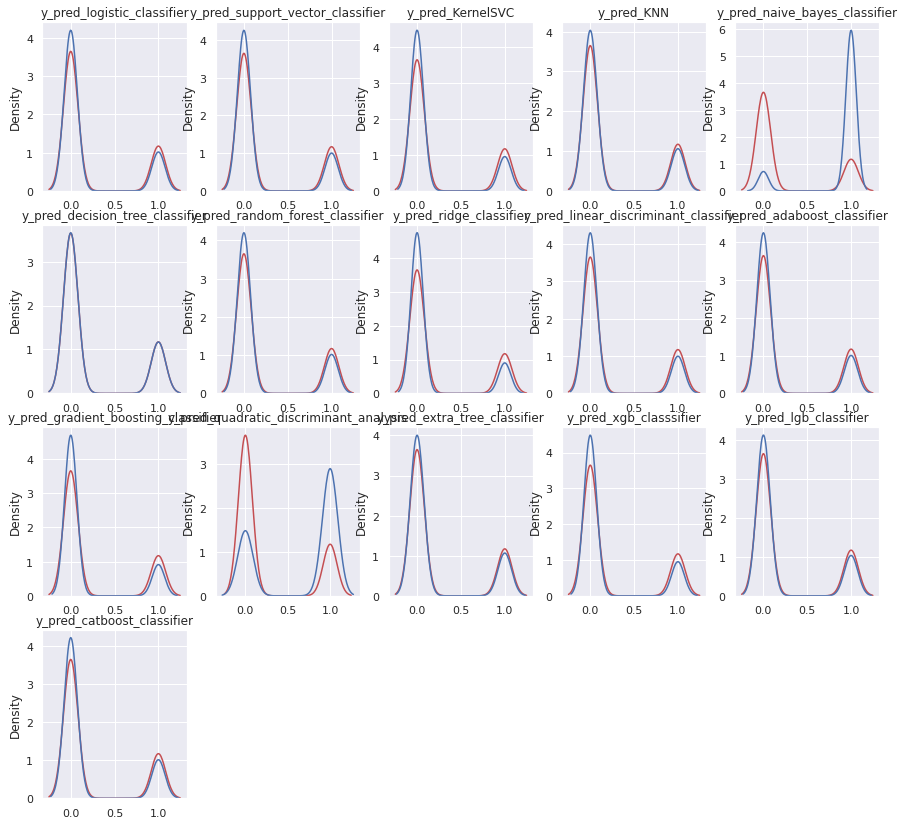

In [94]:
visualize_models(y_test,predictions)

In [95]:
# call this method again for the hypertuned model you will be deploying
def prepare_confusion_matrix(models):
  from sklearn.model_selection import cross_val_predict
  from sklearn.metrics import plot_confusion_matrix
  plt.figure(figsize=(5, 8))
  for model in models:
    plot_confusion_matrix(models[model], x_test, y_test)
    plt.title(f"{model}")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/li

<Figure size 1500x2400 with 0 Axes>

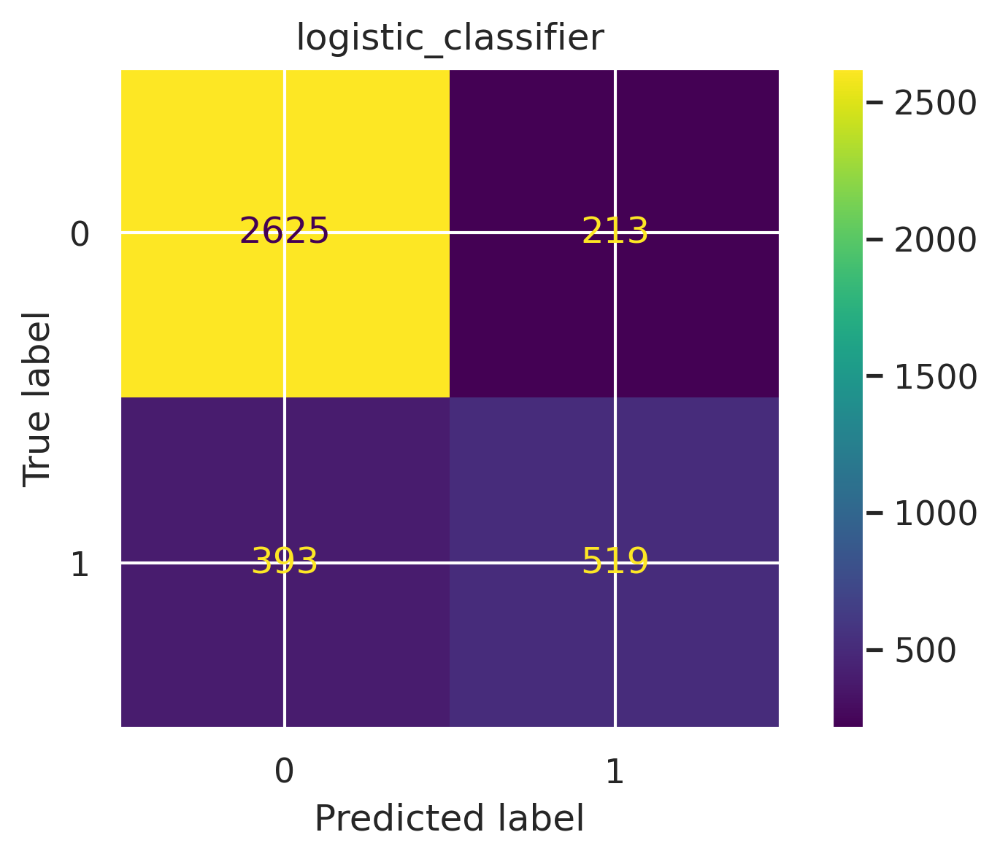

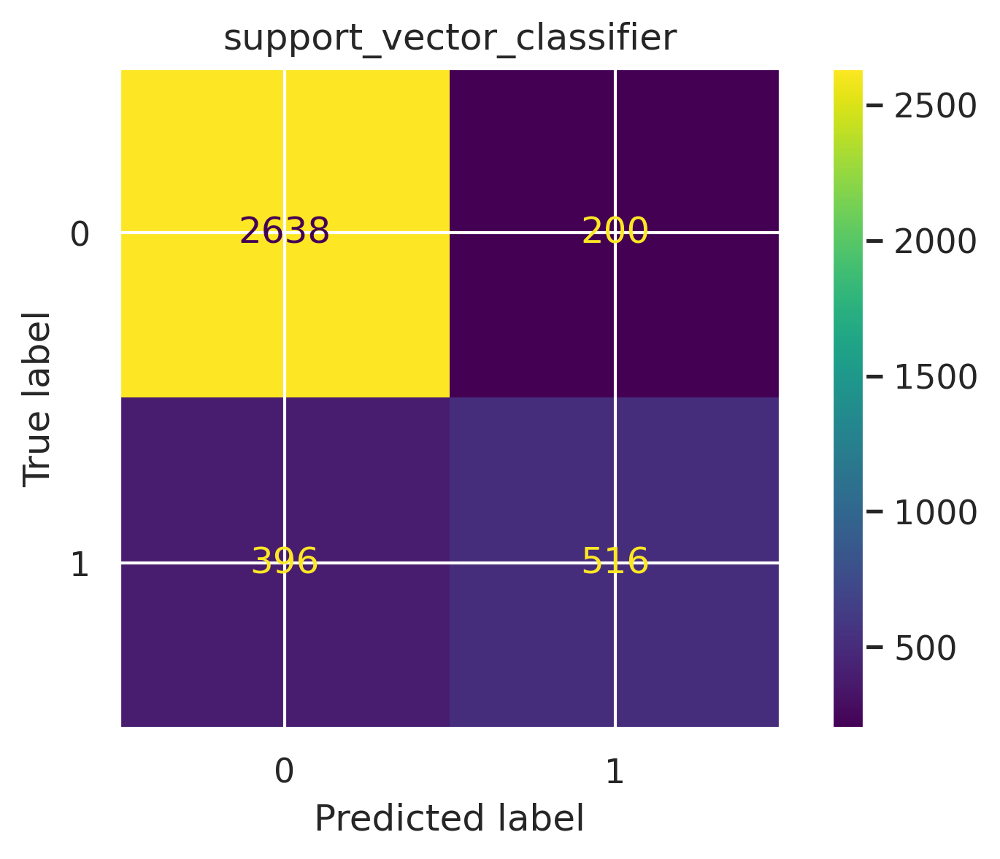

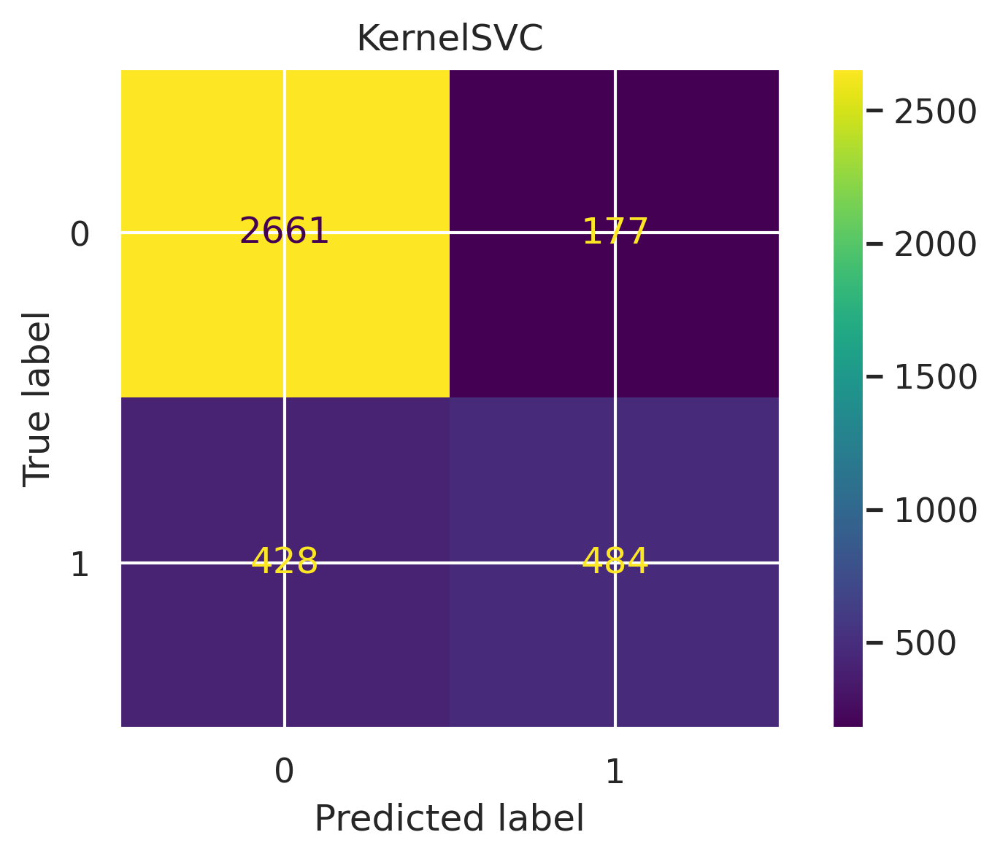

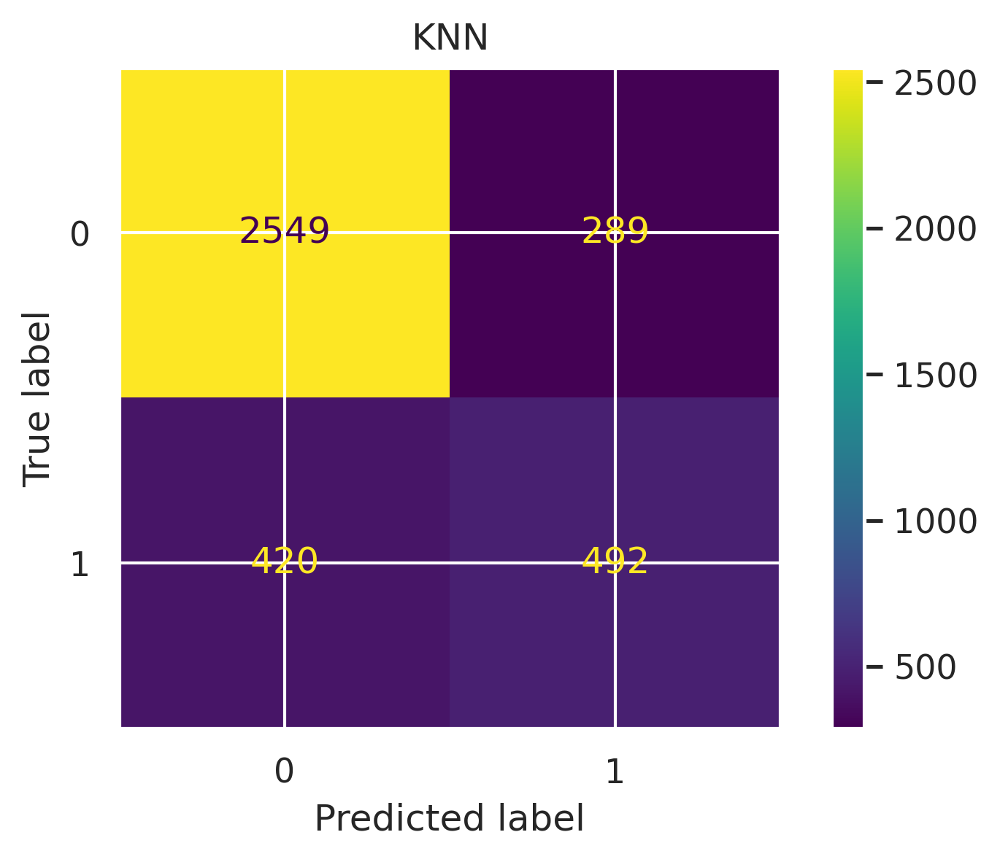

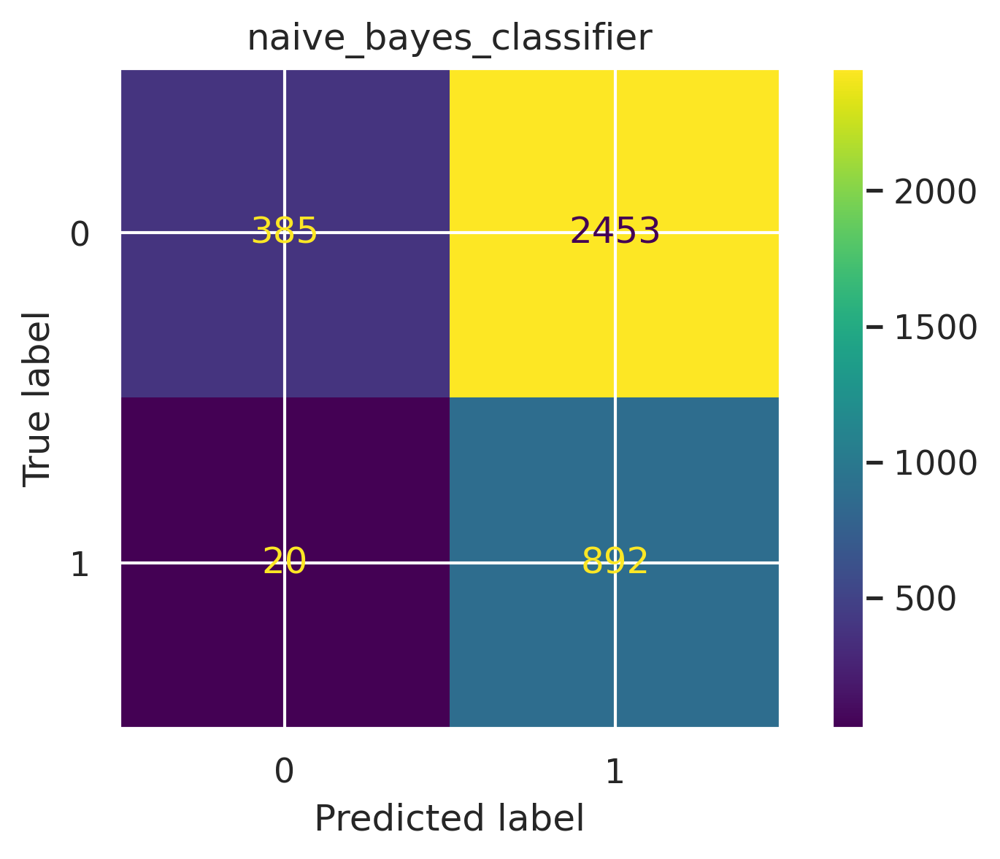

...

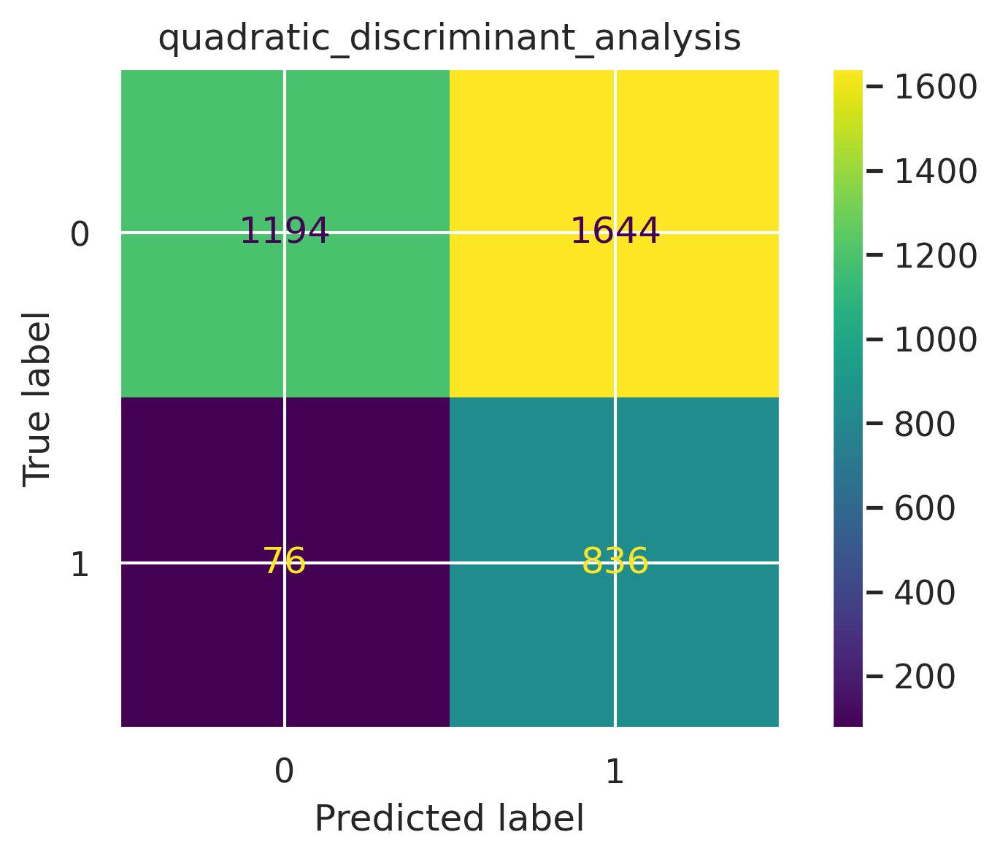

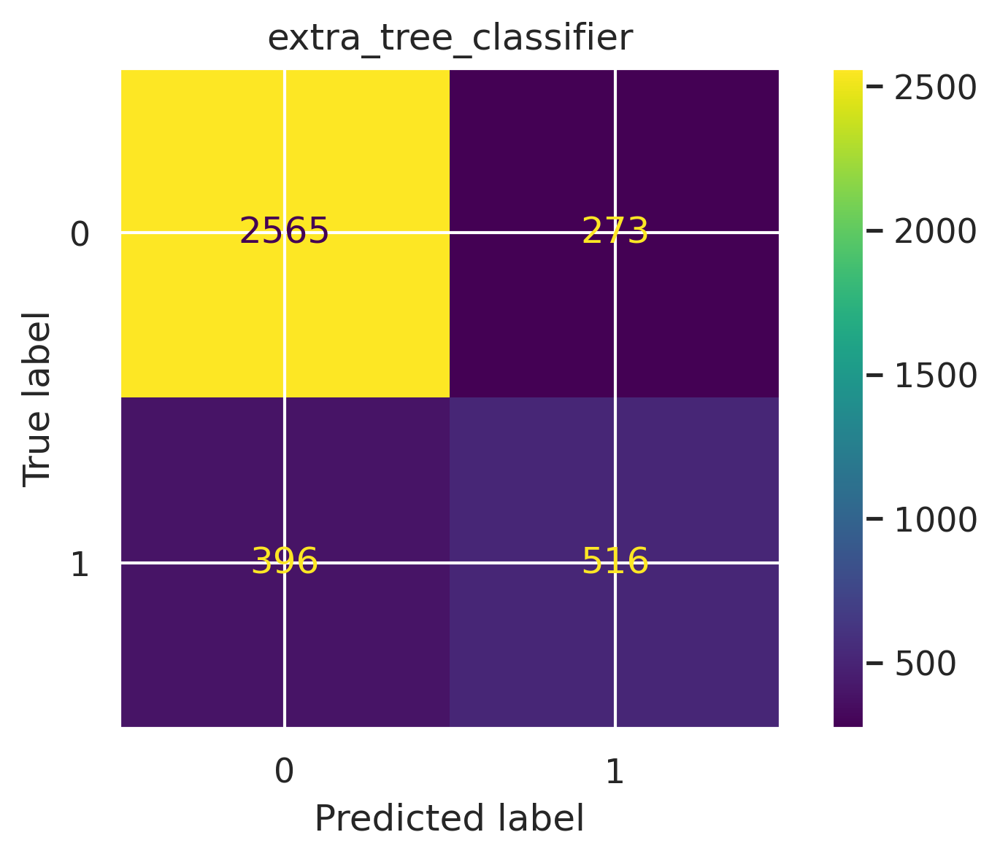

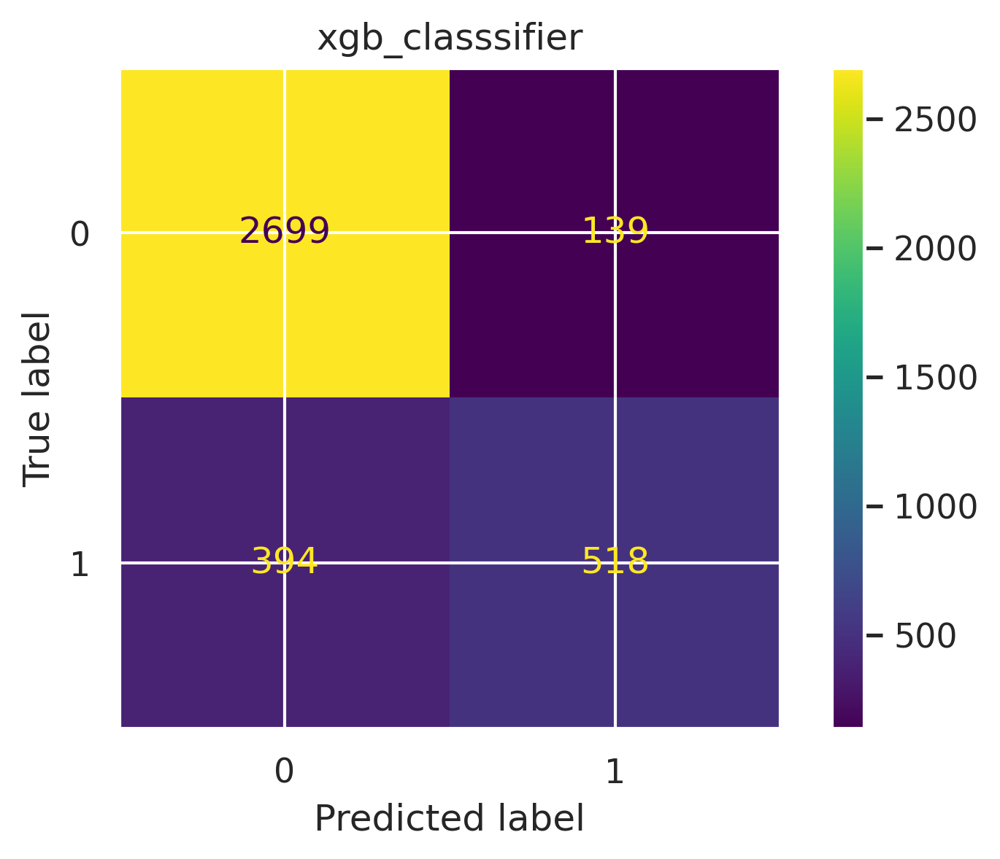

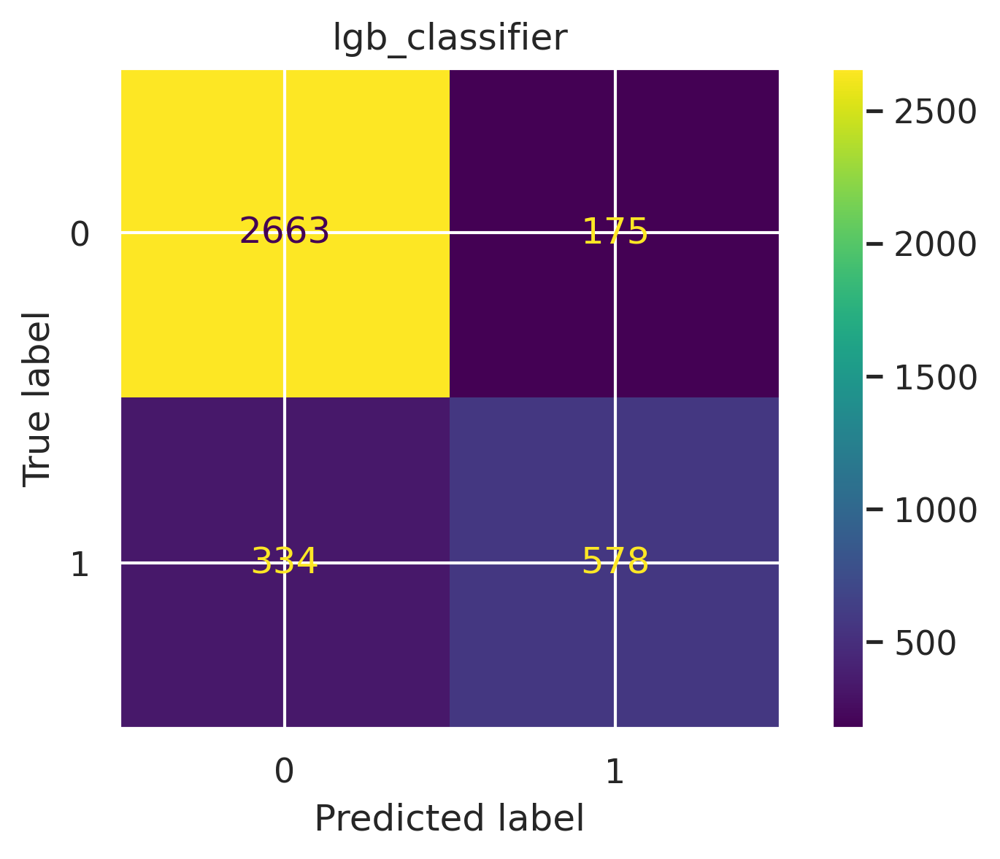

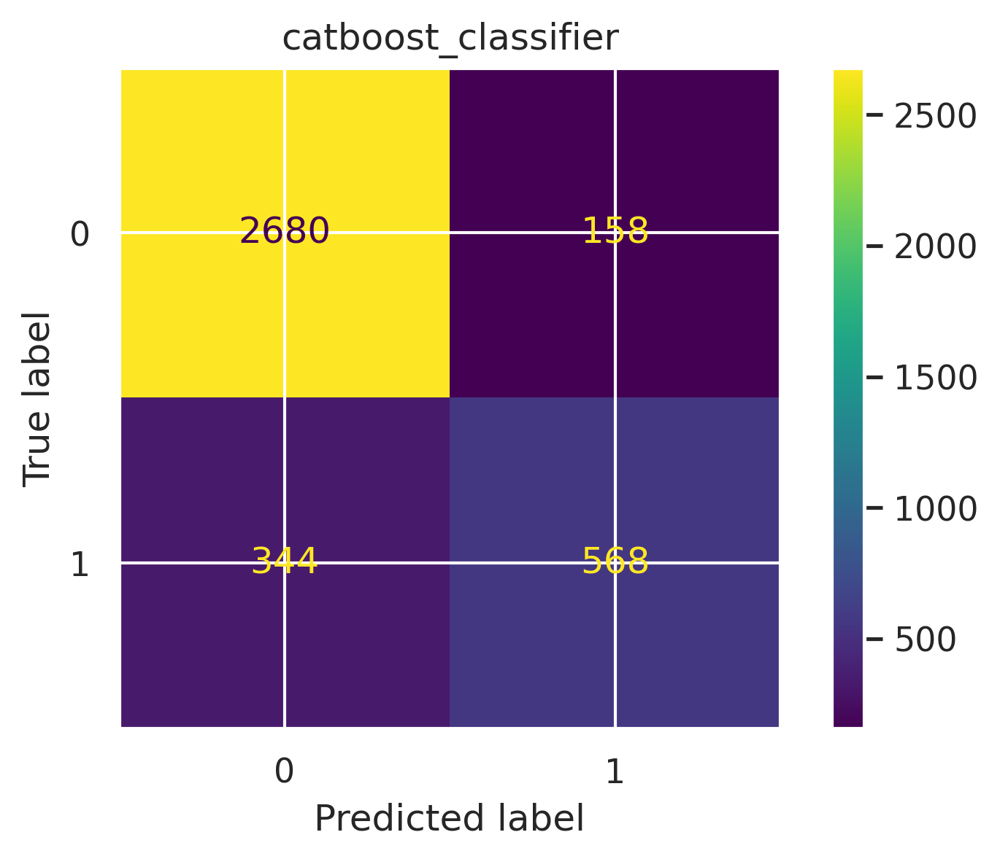

In [96]:
prepare_confusion_matrix(models)

In [97]:
# apply cross validation for this
def ROC_Curve(predictions):
  import sklearn.metrics as metrics
  a = 5  # number of rows
  b = 5  # number of columns 
  c = 1  # initialize plot counter
  for prediction in predictions:
    fig = plt.figure(figsize=(15,18))
    plt.subplot(a, b, c)
    fpr, tpr, threshold = metrics.roc_curve(y_test, predictions[prediction])
    roc_auc = metrics.auc(fpr, tpr)
    plt.title(f'{prediction}')
    plt.plot(fpr, tpr, 'g', label = 'AUC = %0.2f' % roc_auc)
    c=c+1
    if c > a*b:
      break

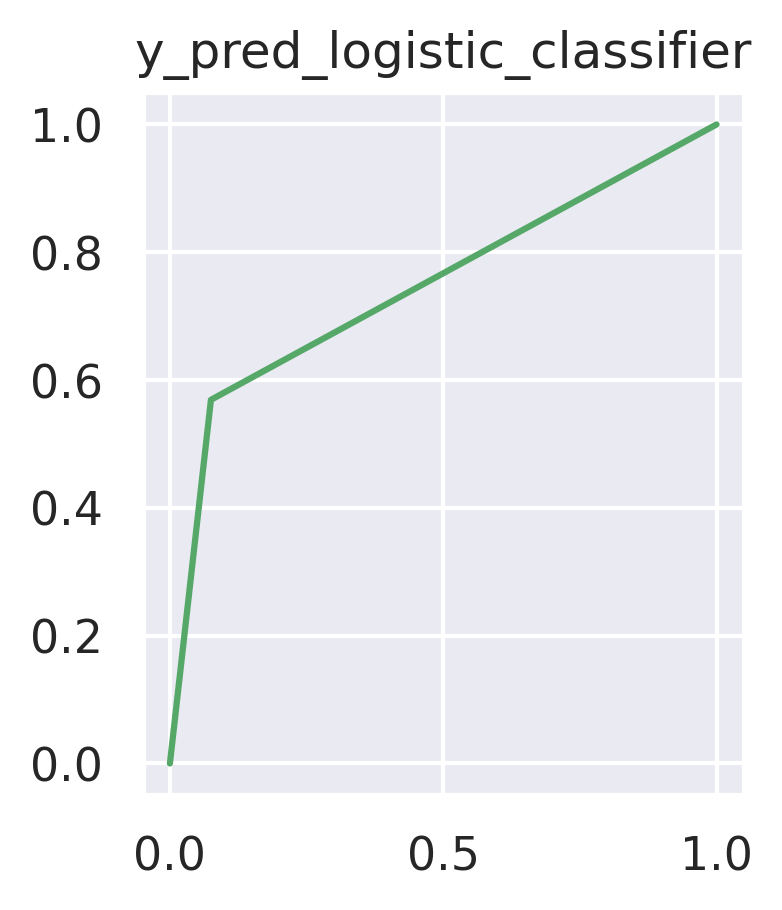

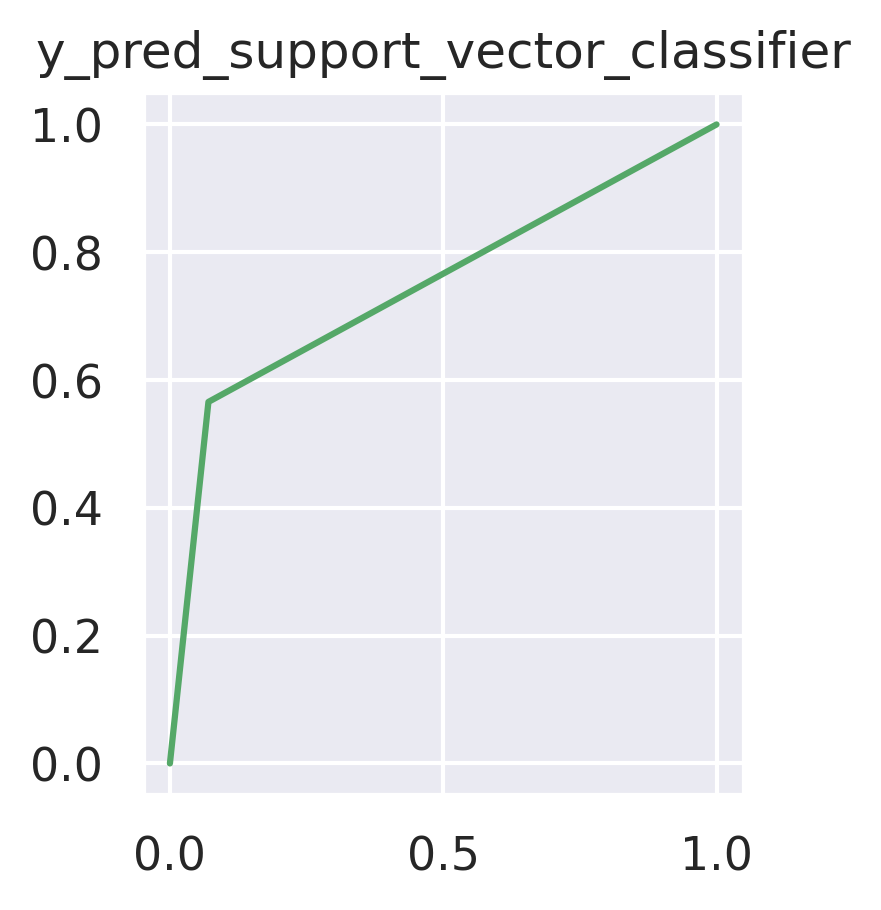

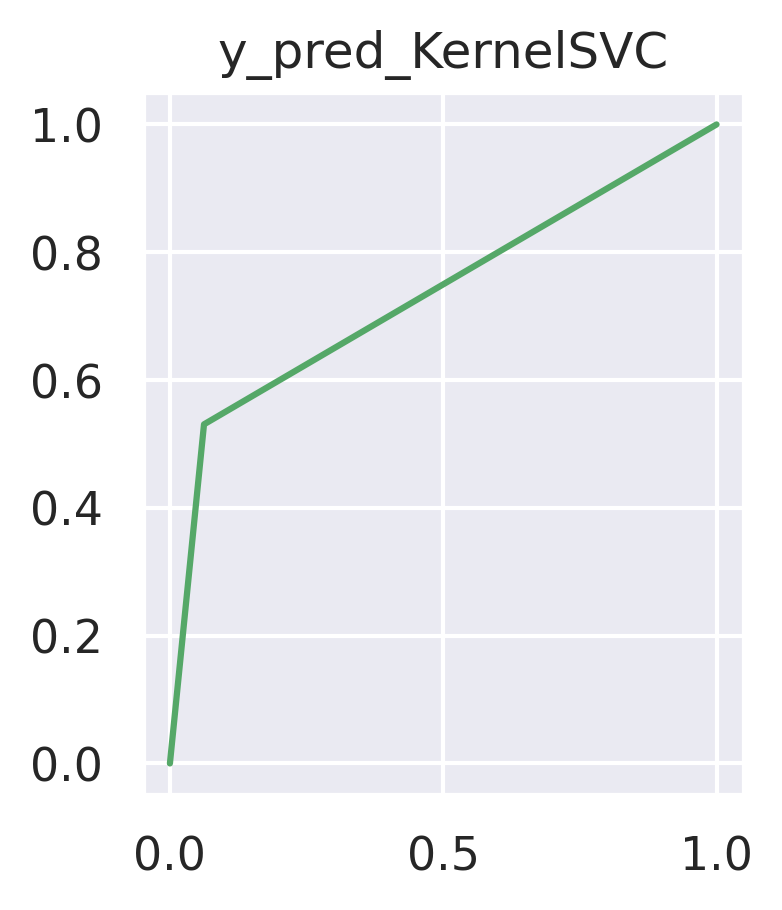

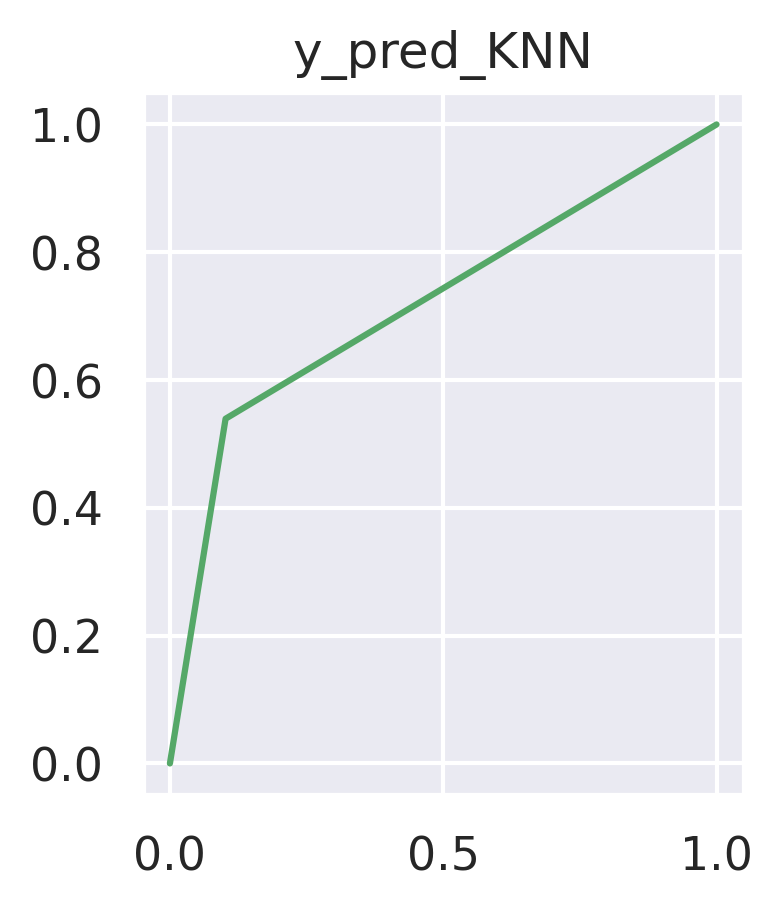

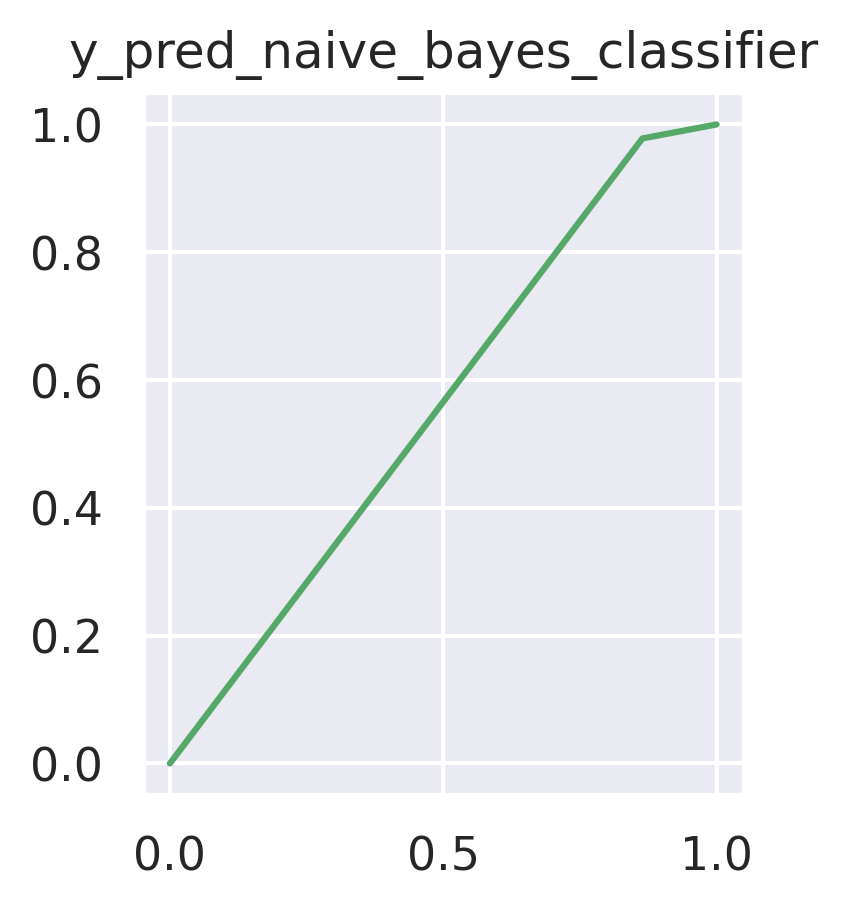

...

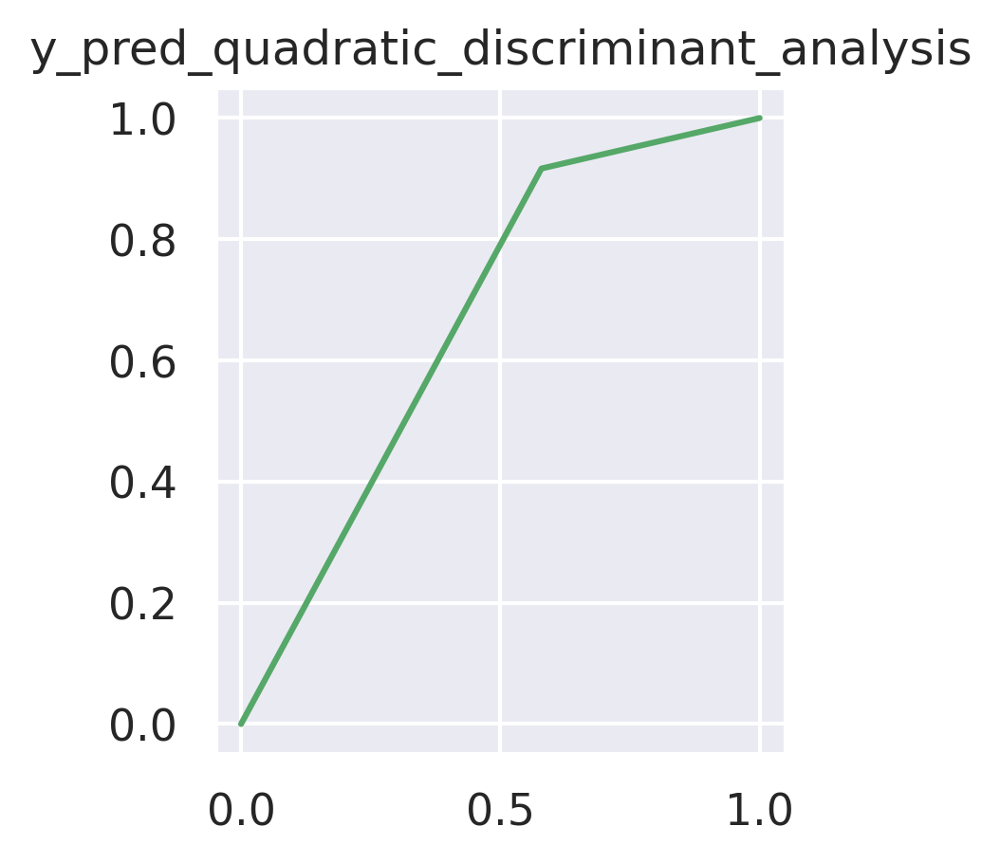

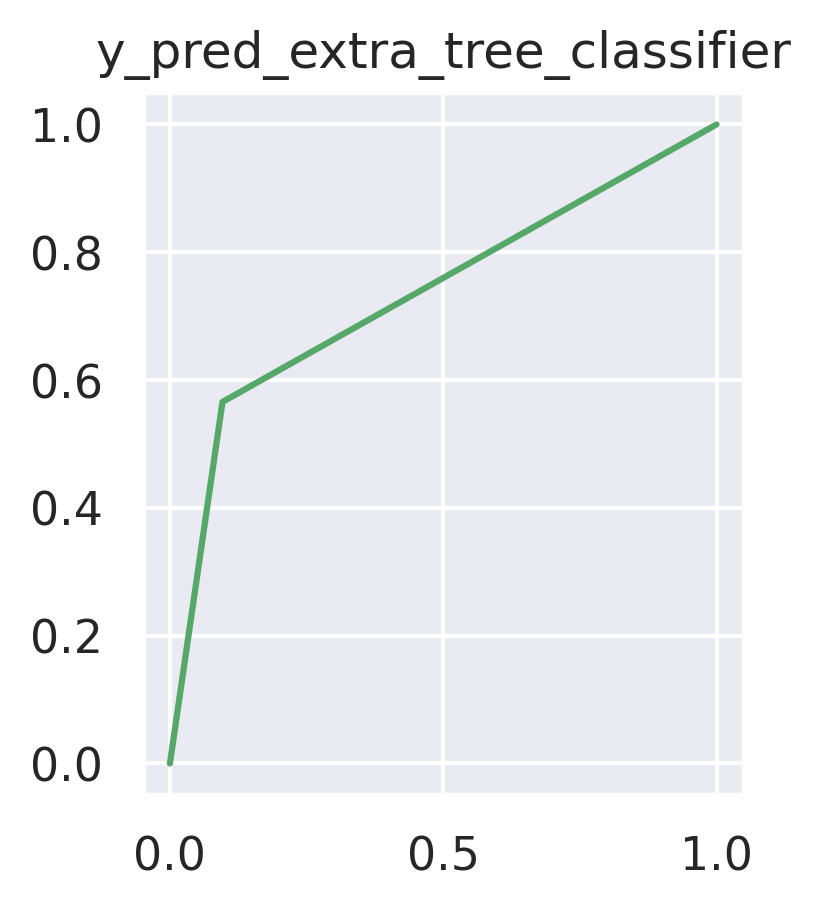

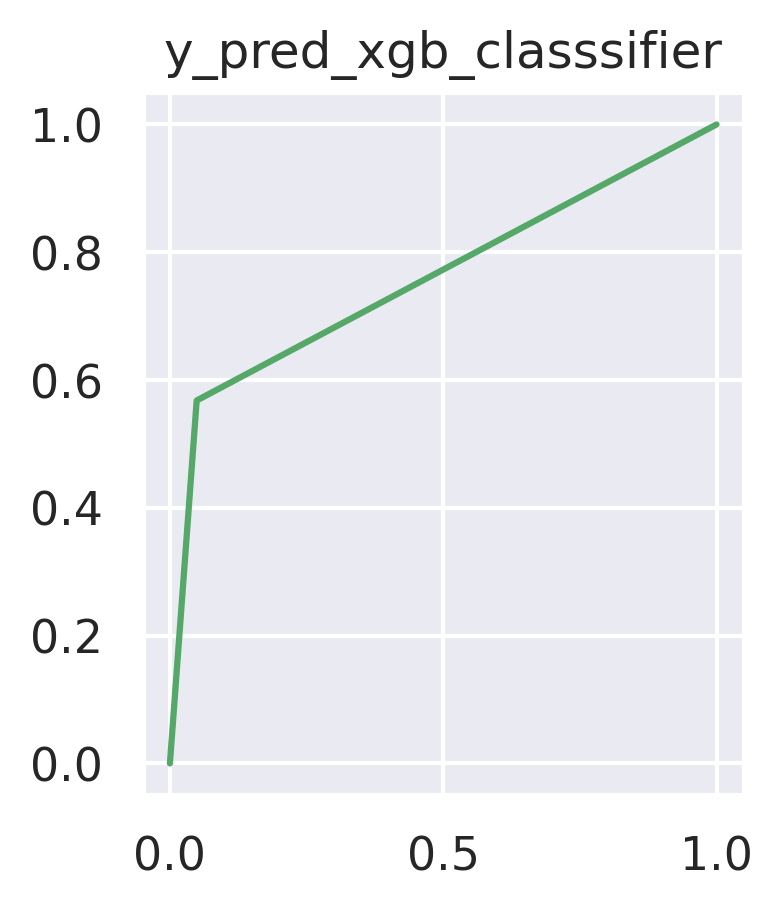

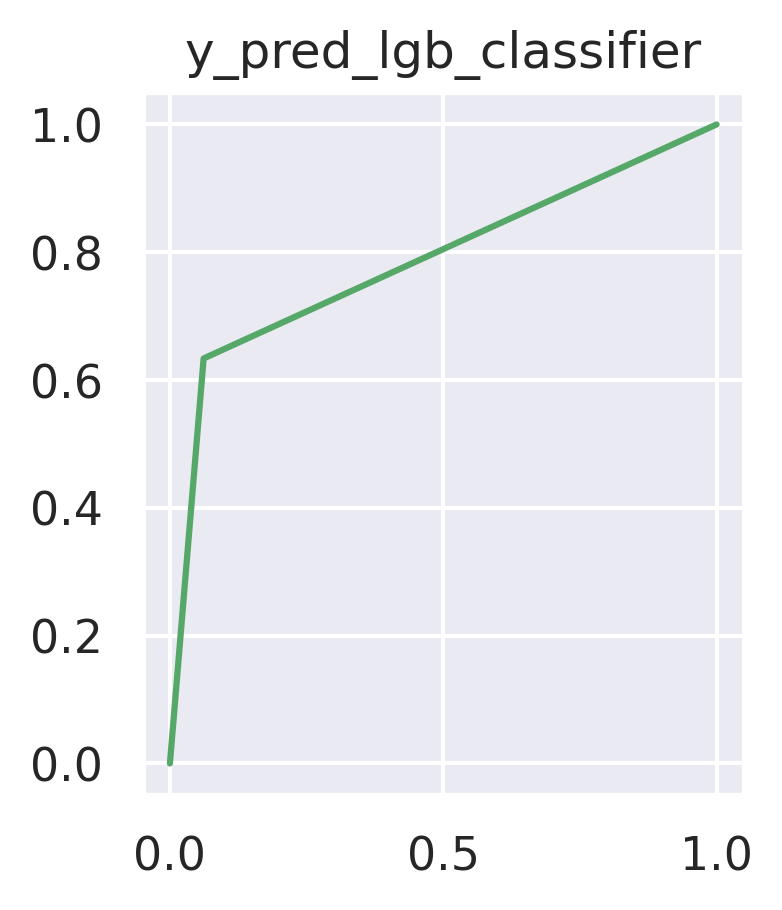

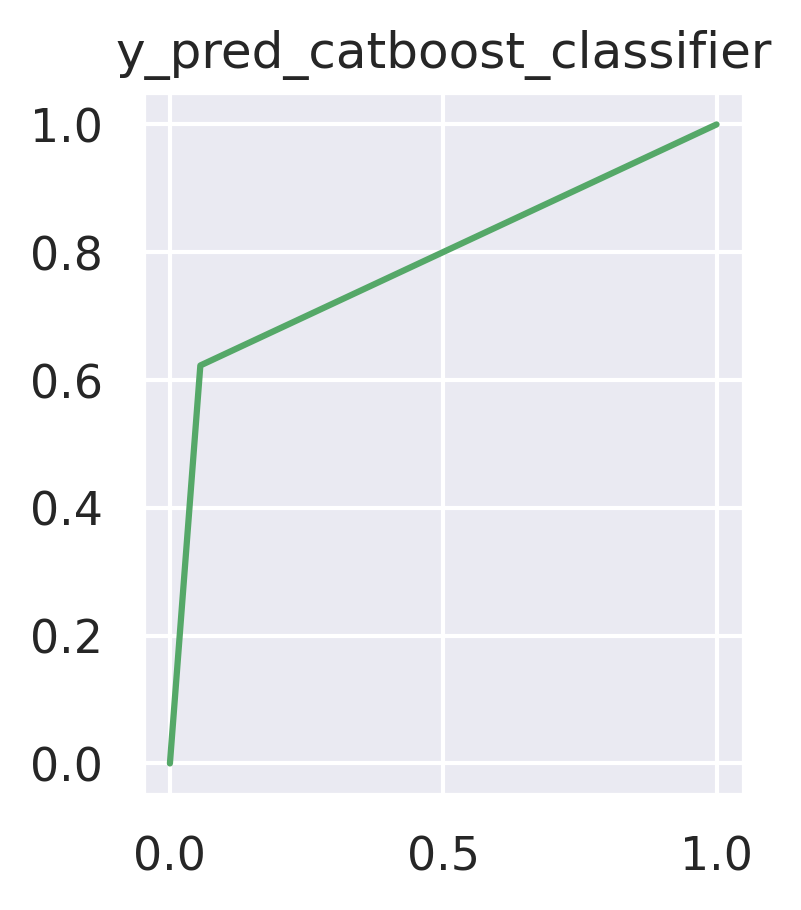

In [98]:
ROC_Curve(predictions) 

In [99]:
def AUC_curve(predictions):
  from sklearn import metrics
  a = 5  # number of rows
  b = 5  # number of columns 
  c = 1  # initialize plot counter
  for prediction in predictions:
    auc = metrics.roc_auc_score(y_test, predictions[prediction])
    false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, predictions[prediction])
    fig = plt.figure(figsize=(15,18))
    plt.subplot(a, b, c)
    plt.title(prediction)
    plt.plot(false_positive_rate, true_positive_rate, 'g')
    plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
    plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
   

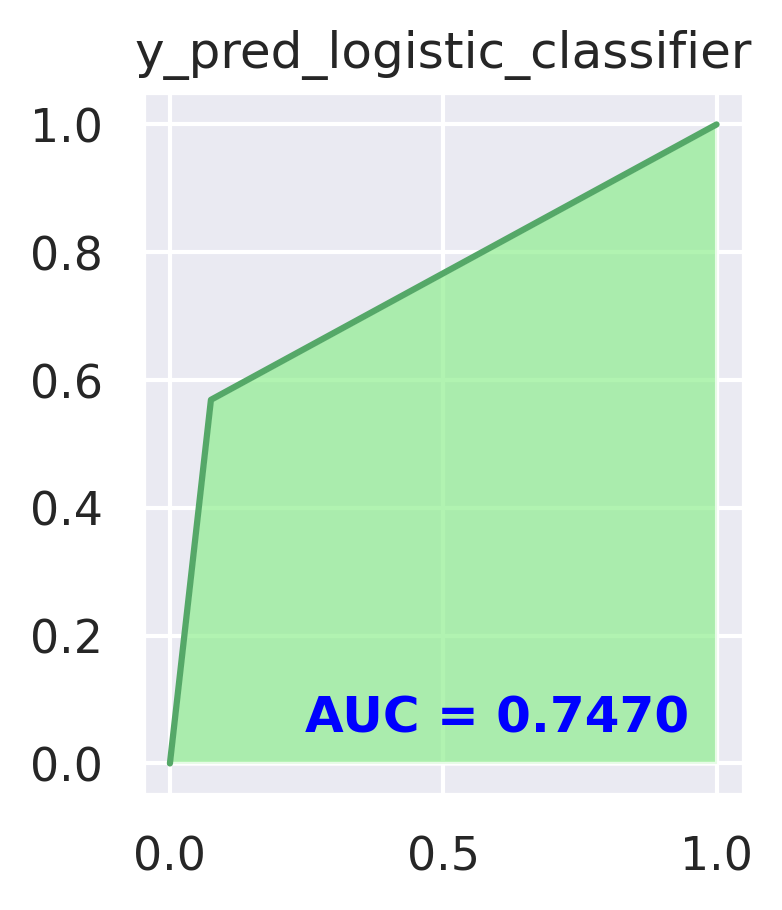

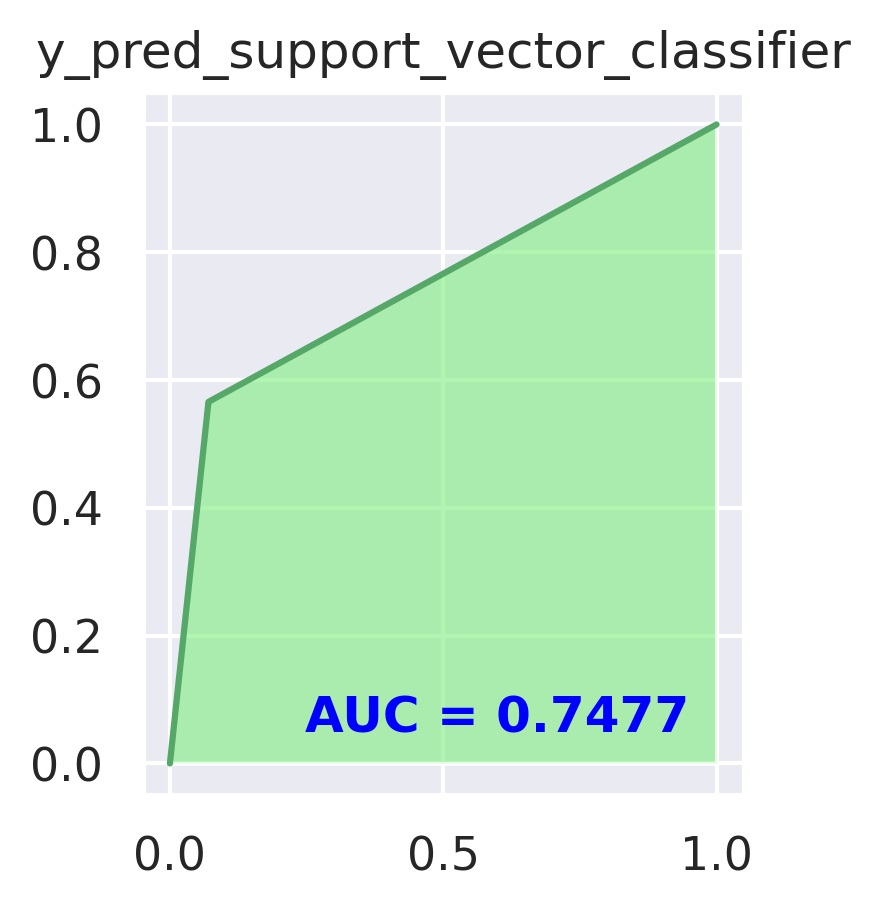

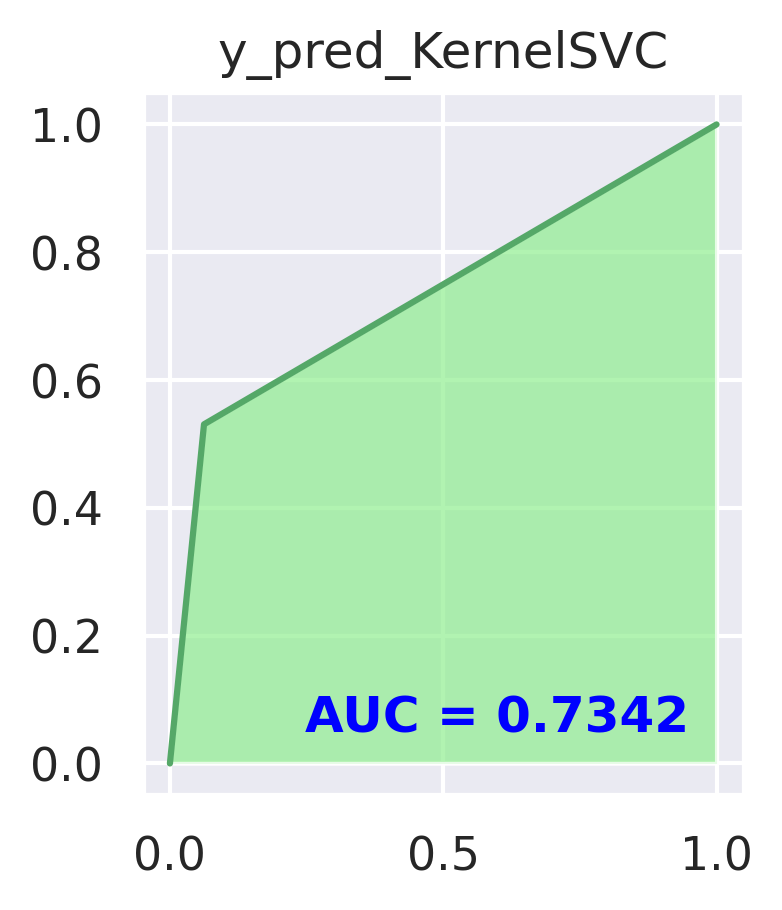

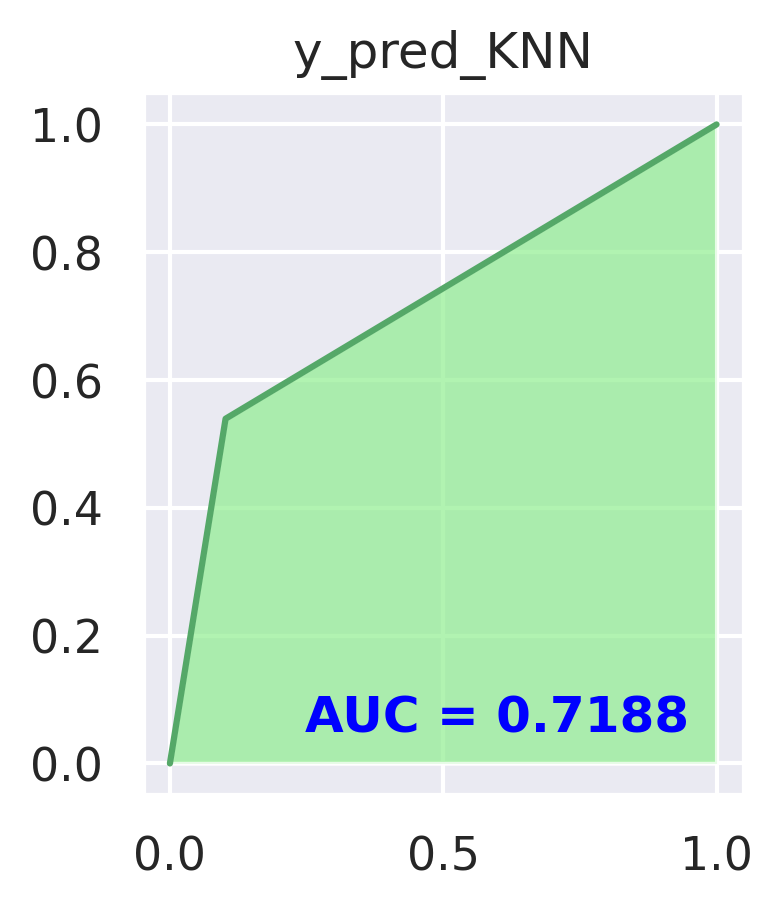

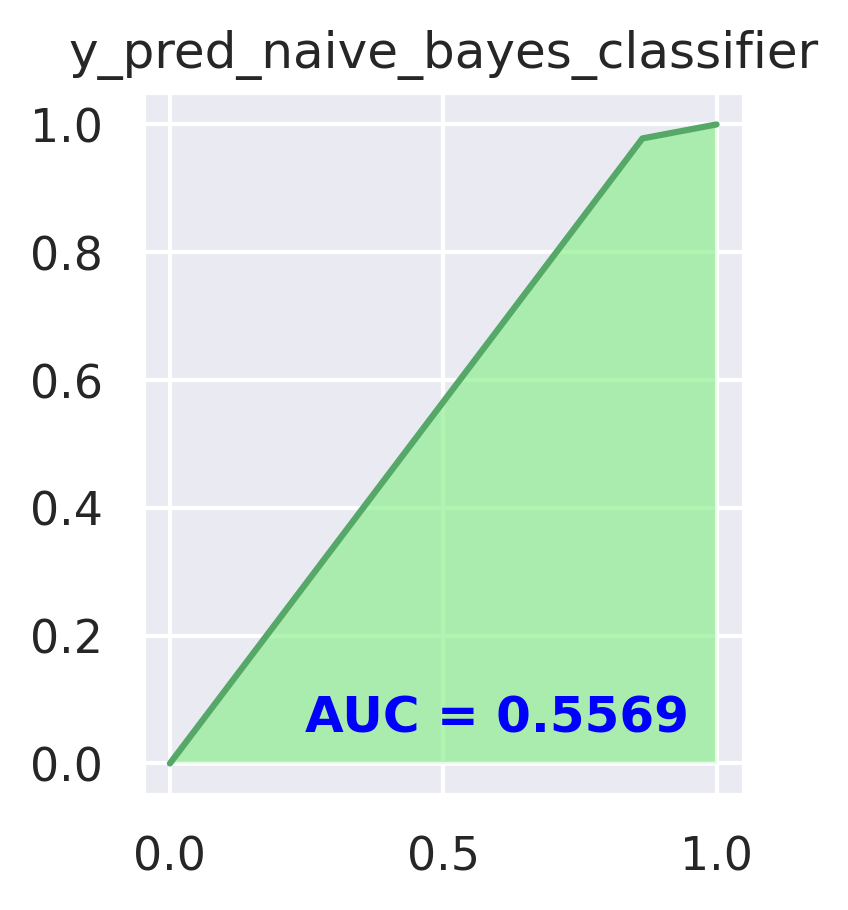

...

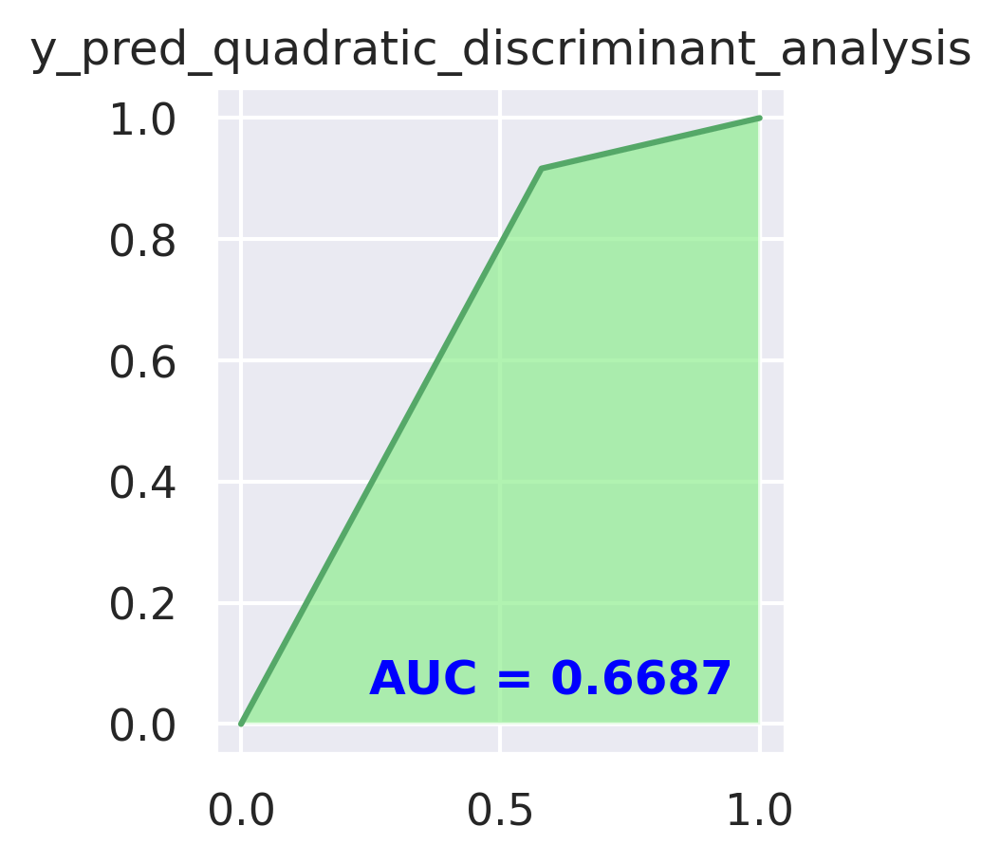

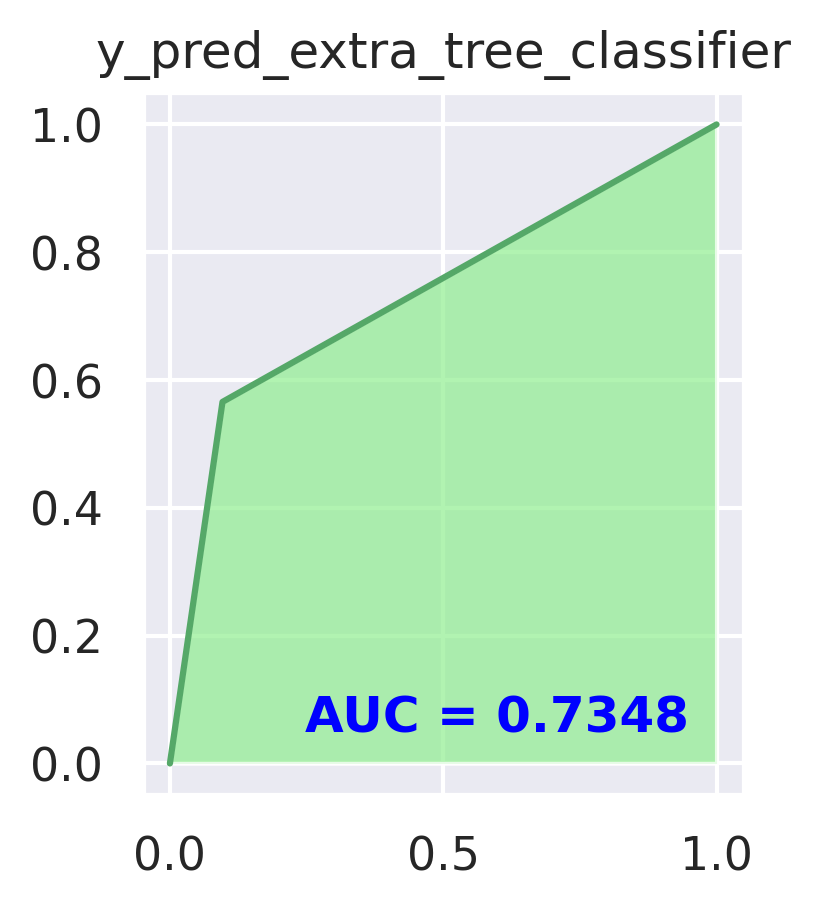

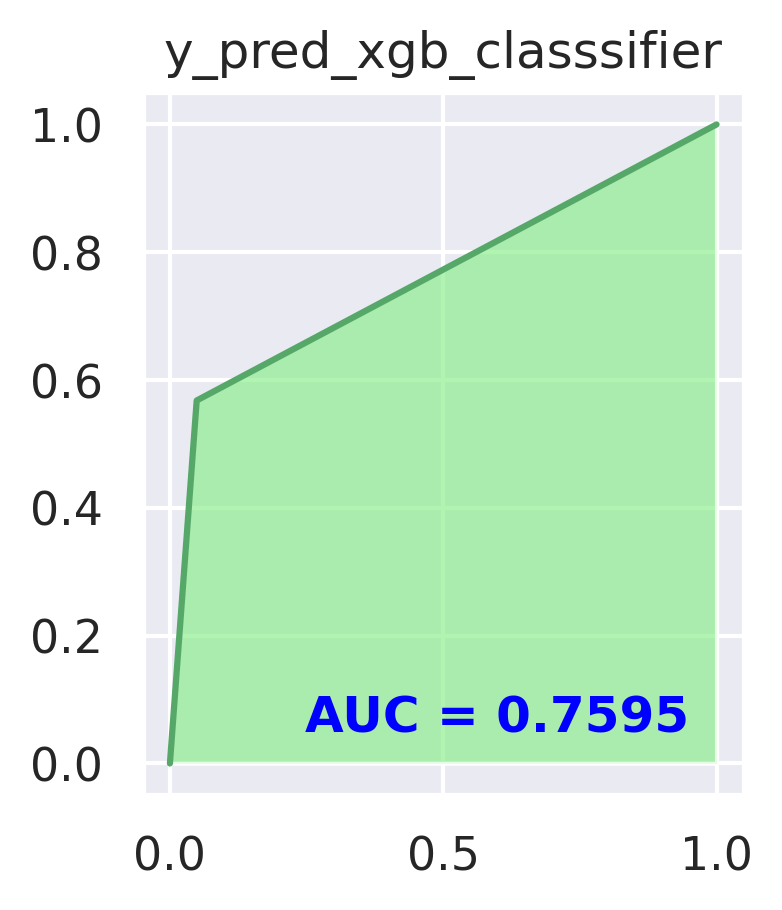

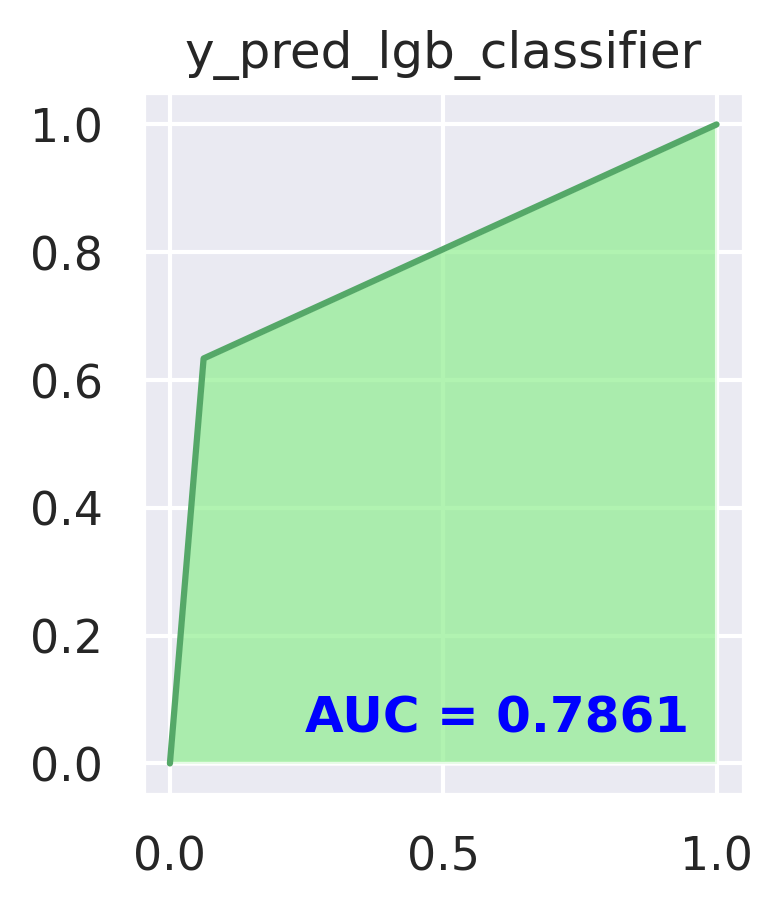

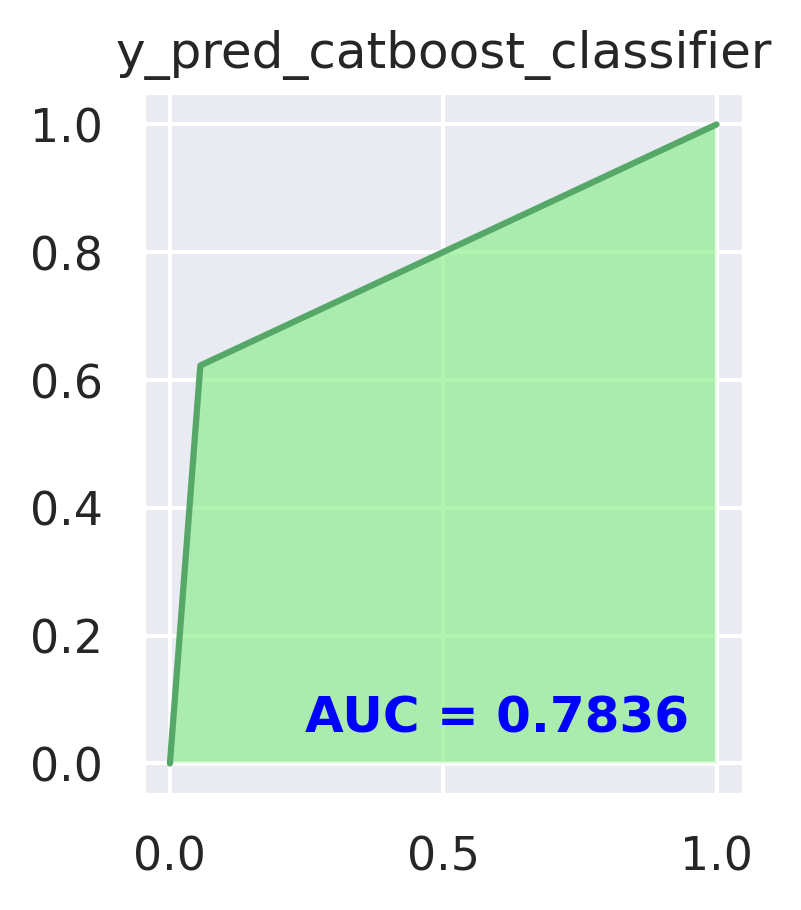

In [100]:
AUC_curve(predictions)

In [101]:
def matric_evaluation_of_models(models):
  
  from sklearn.model_selection import cross_validate
  evaluation={}
  for model in models:
    f1 = cross_validate(estimator=models[model], X = x_train, y = y_train, cv = 10,verbose=0,scoring='f1')
    accuracy = cross_validate(estimator=models[model], X = x_train, y = y_train, cv = 10,verbose=0,scoring='accuracy')
    # probablity = True for svc classifier since log loss requires this probablity
    # log_loss = cross_validate(estimator=models[model], X = x_train, y = y_train, cv = 10,verbose=0,scoring='neg_log_loss')
    # use this metric for the tuned model and with svc try probality = true if you are going with this model
    precision = cross_validate(estimator=models[model], X = x_train, y = y_train, cv = 10,verbose=0,scoring='precision')
    recall = cross_validate(estimator=models[model], X = x_train, y = y_train, cv = 10,verbose=0,scoring='recall')
    auc = cross_validate(estimator=models[model], X = x_train, y = y_train, cv = 10,verbose=0,scoring='roc_auc')
    
    evaluation[model]={'f1':f1['test_score'].mean(),'accuracy':accuracy['test_score'].mean(),'precision':precision['test_score'].mean(),'recall':recall['test_score'].mean(),'auc':auc['test_score'].mean()}
  return evaluation

'''
1)Accuracy
2)Detection Rate

4)Senstivity(true positive rate)
5)Specificity(false positive rate)
6)Precision
7)Recall
8)F1 score(sort the data frame according to this metric)
Calculate these parameter on the trained and tuned model which you will be deploying
3)Log loss
9)Senstivity 
10)Specificity
'''


'\n1)Accuracy\n2)Detection Rate\n\n4)Senstivity(true positive rate)\n5)Specificity(false positive rate)\n6)Precision\n7)Recall\n8)F1 score(sort the data frame according to this metric)\nCalculate these parameter on the trained and tuned model which you will be deploying\n3)Log loss\n9)Senstivity \n10)Specificity\n'

In [102]:
scores=matric_evaluation_of_models(models)
display(scores)

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:878: UserWarning:

Variables are collinear

/usr/local/lib/python3.7/dist-packages/sklearn/discriminant_analysis.py:

Streaming output truncated to the last 5000 lines.
4:	learn: 0.5742598	total: 22.2ms	remaining: 4.42s
5:	learn: 0.5548371	total: 26.6ms	remaining: 4.4s
6:	learn: 0.5385290	total: 30.8ms	remaining: 4.37s
7:	learn: 0.5233989	total: 35.1ms	remaining: 4.36s
8:	learn: 0.5109257	total: 39.5ms	remaining: 4.35s
9:	learn: 0.4974198	total: 43.9ms	remaining: 4.35s
10:	learn: 0.4854861	total: 48.9ms	remaining: 4.39s
11:	learn: 0.4732266	total: 53.9ms	remaining: 4.43s
12:	learn: 0.4630577	total: 58.3ms	remaining: 4.42s
13:	learn: 0.4536127	total: 62.7ms	remaining: 4.41s
14:	learn: 0.4436026	total: 67.1ms	remaining: 4.41s
15:	learn: 0.4360291	total: 71.8ms	remaining: 4.42s
16:	learn: 0.4291893	total: 76.2ms	remaining: 4.41s
17:	learn: 0.4206966	total: 80.7ms	remaining: 4.4s
18:	learn: 0.4140604	total: 85ms	remaining: 4.39s
19:	learn: 0.4075589	total: 89.5ms	remaining: 4.38s
20:	learn: 0.4025126	total: 93.9ms	remaining: 4.38s
21:	learn: 0.3982579	total: 98.3ms	remaining: 4.37s
22:	learn: 0.3936238	to

{'KNN': {'accuracy': 0.8160000000000001,
  'auc': 0.8271320306395706,
  'f1': 0.5833671886361127,
  'precision': 0.633344277016048,
  'recall': 0.5414835932696069},
 'KernelSVC': {'accuracy': 0.8445333333333334,
  'auc': 0.8845138489367311,
  'f1': 0.6226553855758304,
  'precision': 0.7369923714730551,
  'recall': 0.5399617083123707},
 'adaboost_classifier': {'accuracy': 0.8609777777777777,
  'auc': 0.9144236401785506,
  'f1': 0.6776544230286345,
  'precision': 0.7566605989248075,
  'recall': 0.6143440102856503},
 'catboost_classifier': {'accuracy': 0.8684444444444445,
  'auc': 0.9226277943584332,
  'f1': 0.6949853262544086,
  'precision': 0.7746478113955254,
  'recall': 0.6311616076918778},
 'decision_tree_classifier': {'accuracy': 0.8168000000000001,
  'auc': 0.7512879553724537,
  'f1': 0.6188929145106719,
  'precision': 0.6127130014471918,
  'recall': 0.6263234389848511},
 'extra_tree_classifier': {'accuracy': 0.8276444444444444,
  'auc': 0.8719342021952015,
  'f1': 0.61353795362711

In [103]:
def prepare_df_model_evaluation(scores,sort:str='f1'):
  index=[]
  for i in range(0,len(scores)):
    index.append(i)
  columns=['model','accuracy','auc','f1','precision','recall']
  
  from sklearn.model_selection import cross_val_score
  data_score=[]
  for score in scores:
    data_premature=[]
    data_premature.append(score)
    data_premature.append(scores[score]['accuracy'])
    data_premature.append(scores[score]['auc'])
    data_premature.append(scores[score]['f1'])
    data_premature.append(scores[score]['precision'])
    data_premature.append(scores[score]['recall'])
    data_score.append(data_premature)
  score_data = pd.DataFrame(data=data_score,index=index,columns=columns)
  score_data = score_data.sort_values(by=[sort],ascending=False)
  return score_data

In [104]:
scores_data=prepare_df_model_evaluation(scores,'f1')#pass the second paramaetere as the sorting metrics
display(scores_data)

,model,accuracy,auc,f1,precision,recall
14,lgb_classifier,0.867733,0.920934,0.695421,0.769387,0.635649
15,catboost_classifier,0.868444,0.922628,0.694985,0.774648,0.631162
9,adaboost_classifier,0.860978,0.914424,0.677654,0.756661,0.614344
13,xgb_classsifier,0.862844,0.917680,0.668032,0.787672,0.580712
0,logistic_classifier,0.849689,0.899617,0.651752,0.726500,0.591523
1,support_vector_classifier,0.849156,0.897016,0.644475,0.734343,0.575089
10,gradient_boosting_classifier,0.857244,0.910641,0.642150,0.796399,0.538862
6,random_forest_classifier,0.843467,0.870084,0.627550,0.723054,0.555287
8,linear_discriminant_classifier,0.839200,0.888705,0.624875,0.703223,0.563501
2,KernelSVC,0.844533,0.884514,0.622655,0.736992,0.539962


In [105]:
#Senstivity and sepecificity 
#this function works only for a simple model therfore no cross validation you can call this
#function on your tuned model which you will be deploying
def perf_measure(y_actual, y_hat):
    TP = 0
    FP = 0
    TN = 0
    FN = 0

    for i in range(len(y_hat)): 
        if y_actual[i]==y_hat[i]==1:
           TP += 1
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           FP += 1
        if y_actual[i]==y_hat[i]==0:
           TN += 1
        if y_hat[i]==0 and y_actual[i]!=y_hat[i]:
           FN += 1

    return(TP, FP, TN, FN)

In [106]:
def get_confusion_params(predictions):
  params={}
  for prediction in predictions:
    values =  perf_measure(y_test, predictions[prediction])
    TP,FP,TN,FN = values
    params[prediction]={'TP':TP,'FP':FP,'TN':TN,'FN':FN}
  return params

values=get_confusion_params(predictions)


In [107]:
def calculate_specificity(params):
  return params['TN']/(params['TN']+params['FP'])

In [108]:
def calculate_senstivity(params):
  return params['TN']/(params['TP']+params['FN'])

In [109]:
def specificity_senstivity(values):
  scoring_metric={}
  for val in values:
    specificity = calculate_specificity(values[val])
    senstivity = calculate_senstivity(values[val])
    scoring_metric[val]={'specificity':specificity,'senstivity':senstivity}
  return scoring_metric

In [110]:
scoring_metric = specificity_senstivity(values)
display(scoring_metric)

{'y_pred_KNN': {'senstivity': 2.794956140350877,
  'specificity': 0.8981677237491191},
 'y_pred_KernelSVC': {'senstivity': 2.9177631578947367,
  'specificity': 0.9376321353065539},
 'y_pred_adaboost_classifier': {'senstivity': 2.9155701754385963,
  'specificity': 0.9369274136715997},
 'y_pred_catboost_classifier': {'senstivity': 2.93859649122807,
  'specificity': 0.9443269908386187},
 'y_pred_decision_tree_classifier': {'senstivity': 2.706140350877193,
  'specificity': 0.8696264975334743},
 'y_pred_extra_tree_classifier': {'senstivity': 2.8125,
  'specificity': 0.9038054968287527},
 'y_pred_gradient_boosting_classifier': {'senstivity': 2.9802631578947367,
  'specificity': 0.9577167019027484},
 'y_pred_lgb_classifier': {'senstivity': 2.919956140350877,
  'specificity': 0.9383368569415081},
 'y_pred_linear_discriminant_classifier': {'senstivity': 2.8728070175438596,
  'specificity': 0.923185341789993},
 'y_pred_logistic_classifier': {'senstivity': 2.8782894736842106,
  'specificity': 0.9

In [111]:
#log loss function
#note for this function probality=true for SVC models
#since this loss function works on probablity
#exclude SVC from this function if you are not using probablity = True
def calculate_log_loss(models):
  
  from sklearn.model_selection import cross_validate
  evaluation={}
  for model in models:
    # probablity = True for svc classifier since log loss requires this probablity
    log_loss = cross_validate(estimator=models[model], X = x_train, y = y_train, cv = 10,verbose=0,scoring='neg_log_loss')
    # use this metric for the tuned model and with svc try probality = true if you are going with this model
    evaluation[model]={'log_loss':log_loss}
  return evaluation

log_loss =  calculate_log_loss(models) # I repeat again Include SVC model only if you have probablity = true 

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:774: UserWarning:

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_scorer.py", line 221, in __call__
    sample_weight=sample_weight,
  File "/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_scorer.py", line 298, in _score
    y_pred = method_caller(clf, "predict_proba", X)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_scorer.py", line 68, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/utils/metaestimators.py", line 109, in __get__
    if not self.check(obj):
  File "/usr/local/lib/python3.7/dist-pack

Streaming output truncated to the last 5000 lines.
4:	learn: 0.5742598	total: 22.3ms	remaining: 4.44s
5:	learn: 0.5548371	total: 26.8ms	remaining: 4.43s
6:	learn: 0.5385290	total: 31.1ms	remaining: 4.42s
7:	learn: 0.5233989	total: 35.6ms	remaining: 4.42s
8:	learn: 0.5109257	total: 40.2ms	remaining: 4.42s
9:	learn: 0.4974198	total: 44.7ms	remaining: 4.42s
10:	learn: 0.4854861	total: 49.1ms	remaining: 4.41s
11:	learn: 0.4732266	total: 53.8ms	remaining: 4.43s
12:	learn: 0.4630577	total: 58.2ms	remaining: 4.42s
13:	learn: 0.4536127	total: 62.6ms	remaining: 4.41s
14:	learn: 0.4436026	total: 67ms	remaining: 4.4s
15:	learn: 0.4360291	total: 71.4ms	remaining: 4.39s
16:	learn: 0.4291893	total: 75.8ms	remaining: 4.38s
17:	learn: 0.4206966	total: 80.2ms	remaining: 4.37s
18:	learn: 0.4140604	total: 84.7ms	remaining: 4.38s
19:	learn: 0.4075589	total: 89.4ms	remaining: 4.38s
20:	learn: 0.4025126	total: 94.1ms	remaining: 4.38s
21:	learn: 0.3982579	total: 98.8ms	remaining: 4.39s
22:	learn: 0.3936238	t

In [ ]:
def hypertune_model(model,x_train,y_train,scoring:str='f1'):
  if model == 'logistic_classifier':
    params_grid=LOGISTIC_REGRESSION()
    #'decision_function_shape':ovo or ovr, default is ovr you can compare the model with ovo if you want
  elif model == 'support_vector_classifier':
    params_grid=LINEAR_SVC()
  elif model == 'KernelSVC':
    params_grid = KERNEL_SVC()
  elif model == 'decision_tree_classifier':
    params_grid=DT_CLASSIFIER()
  elif model == 'random_forest_classifier':
    params_grid = RF_CLASSIFIER()
  elif model == 'KNN':
    params_grid=KNN_CLASSIFIER()
  elif model == 'gaussian_classifier':
    params_grid=GAUSSIAN_CLASSIFIER()
  elif model == 'ridge_classifier':
    params_grid = RIDGE_CLASSIFIER()
  elif model == 'linear_discriminant_classifier':
    params_grid = LDA_CLASSIFIER()
  elif model == 'adaboost_classifier':
    params_grid = ADABOOST_CLASSIFIER()
  elif model == 'gradient_boosting_classifier':
    params_grid = GRADIENT_BOOSTING_CLASSIFIER()
  elif model == 'quadratic_discriminant_analysis':
    params_grid = QDA_CLASSIFIER()
  elif model == 'extra_tree_classifier':
    params_grid = ET_CLASSIFIER()
  elif model == 'xgb_classsifier':
    params_grid = XGB_CLASSIFIER()
  elif model == 'lgb_classifier':
    params_grid = LGB_CLASSIFIER()
 
 
  
  print(models[model])
  from sklearn.model_selection import GridSearchCV
  grid=GridSearchCV(estimator=models[model],cv=10,verbose=20,n_jobs=-1,param_grid=params_grid,scoring=scoring)
  grid.fit(x_train,y_train)
  # Checking the score for all parameters
  print("Grid scores on training set:")
  means = grid.cv_results_['mean_test_score']
  stds = grid.cv_results_['std_test_score']
  for mean, std, params in zip(means, stds, grid.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"% (mean, std * 2, params))
  



def LOGISTIC_REGRESSION():
  c=[1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1e1,1e2,1e3,1e4,1e5,1e6,1e7]
  penalty = ['l1', 'l2', 'elasticnet', 'none']
  tol=[1e-6,1e-5,1e-4,1e-3,1e-2,1e-1]
  solver=['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
  multiclass = ['auto', 'ovr', 'multinomial']
  
  warm_start=[True,False]
 
  parameters={'C':c,'penalty':penalty,'tol':tol,'solver':solver,
          'multi_class':multiclass,'warm_start':warm_start,}
  return parameters


def LINEAR_SVC():
  c=[1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1e1,1e2,1e3,1e4,1e5,1e6,1e7]
  shrinking=[True,False]
  probablity=[True,False]
  tol=[1e-6,1e-5,1e-4,1e-3,1e-2,1e-1]
  decision_function_shape=['ovo','ovr']
  break_ties=[False,True]
  parameters=[{'C':c,'shrinking':shrinking,'probability':probablity,
          'tol':tol,'break_ties':break_ties},]
  return parameters

def KERNEL_SVC():
  c=[1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1e1,1e2,1e3,1e4,1e5,1e6,1e7]
  tol=[1e-6,1e-5,1e-4,1e-3,1e-2,1e-1]
  shrinking=[True,False]
  probablity=[True,False]
  break_ties=[False,True]
  degree=[2,3,4,5,6,7,8,9,10]
  gamma = ['scale','auto','float']
  kernel=['poly','rbf','sigmoid'] #exclude precomputed from this list as it is giving error
  return {'C':c,'tol':tol,'shrinking':shrinking,'probability':probablity,
          'break_ties':break_ties,'degree':degree,'gamma':gamma,'kernel':kernel}

def DT_CLASSIFIER():
  criterion=['gini','entropy']
  splitter=['best', 'random']
  max_features=['int','float','auto','sqrt','log2','None']
  return {'criterion':criterion,'splitter':splitter,'max_features':max_features}
  '''
  THis is a short description
  If int, then consider max_features features at each split.
  If float, then max_features is a fraction and int(max_features * n_features) features are considered at each split. 
  If “auto”, then max_features=sqrt(n_features).
  If “sqrt”, then max_features=sqrt(n_features).
  If “log2”, then max_features=log2(n_features).
  If None, then max_features=n_features.
  '''

def RF_CLASSIFIER():
  bootstrap=[True,False]
  criterion=['gini','entropy']
  max_features=['int','float','auto','sqrt','log2','None']
  n_estimators=[10,20,30,40,50,60,70,80,90,100]
  oob_score=[True,False]
  warm_start=[False,True]
  return {'bootstrap':bootstrap,'criterion':criterion,'max_features':max_features,
          'n_estimators':n_estimators,'oob_score':oob_score,
          'warm_start':warm_start}


def KNN_CLASSIFIER():
  algorithm=['auto', 'ball_tree', 'kd_tree', 'brute']
  # the metric 'wminkowski' is a weighted metric and therefore requires a weight metric
  # this metric can be used in the case of imbalanced class
  metric=['euclidean','manhattan','chebyshev','minkowski','seuclidean','mahalanobis']
  n_neighbors=[3,4,5,6,7,8,9,10]
  return {'algorithm':algorithm,'metric':metric,'n_neighbors':n_neighbors}





def GAUSSIAN_CLASSIFIER():
  multi_class=['one_vs_rest', 'one_vs_one']
  warm_start=[True,False]
  copy_X_train=[True,False]
  return {'multi_class':multi_class,
          'warm_start':warm_start,'copy_X_train':copy_X_train}
def RIDGE_CLASSIFIER():
  copy_X=[True,False]
  fit_intercept=[True,False]
  normalize = [True,False]
  random_state = [True,False]
  tol = [1e-6,1e-5,1e-4,1e-3,1e-2,1e-1]
  alpha = [1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]
  solver = ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
  return {'copy_X':copy_X,'fit_intercept':fit_intercept,
          'normalize':normalize,'random_state':random_state,
          'tol':tol,'alpha':alpha,'solver':solver}
def LDA_CLASSIFIER():
  tol = [1e-6,1e-5,1e-4,1e-3,1e-2,1e-1]
  solver=['svd', 'lsqr', 'eigen']
  shrinkage=['auto',float]
  store_covariance=[True,False]
  return {'tol':tol,'solver':solver,'shrinkage':shrinkage,
          'store_covariance':store_covariance}


def ADABOOST_CLASSIFIER():
  algorithm = ['SAMME', 'SAMME.R']
  learning_rate = [1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]
  n_estimators=[50,70,90,100,200,300,400]
  return {'algorithm':algorithm,'learning_rate':learning_rate,
          'n_estimators':n_estimators}

def GRADIENT_BOOSTING_CLASSIFIER():
  learning_rate = [1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]
  criterion = ['friedman_mse', 'mse', 'mae']
  loss = ['deviance', 'exponential']
  max_depth = [3,4,5,6,7,8,9,10]
  n_estimators = [40,50,60,70,80,90,100,200,300]
  tol = [1e-6,1e-5,1e-4,1e-3,1e-2,1e-1]
  warm_start = [True,False]
  return {'learning_rate':learning_rate,
          'criterion':criterion,
          'loss':loss,'max_depth':max_depth,
          'n_estimators':n_estimators,'tol':tol,
          'warm_start':warm_start
          }



def QDA_CLASSIFIER():
  store_covariance = [True,False]
  tol = [1e-6,1e-5,1e-4,1e-3,1e-2,1e-1]
  return  {'store_covariance':store_covariance,
           'tol':tol}
def ET_CLASSIFIER():
  bootstrap = [True,False]
  criterion = ['gini','entropy']
  max_features = ['auto', 'sqrt', 'log2']
  n_estimators = [40,60,80,100,200,300,400]
  oob_score = [True,False]
  warm_start = [True,False]
  return {'bootstrap':bootstrap,'criterion':criterion,'max_features':max_features,
          'n_estimators':n_estimators,'oob_score':oob_score,'warm_start':warm_start}

def XGB_CLASSIFIER():
  params={'booster':['gblinear','gbtree','dart'],'gamma':[1e-2,1e-1,0.2,0.4,0.6,0.8,1.0,2.0,4.0,6.0,8.0,10.0,15.0,20.0],
           'importance_type':['gain','cover'],'leaning_rate':[1e-3,1e-2,1e-1,0.2,0.3,0.4,0.5,0.9,1.0],
           'max_depth':[1,2,3,4,5,6,7,8,9,10],'min_child_weight':[1,2,4,5,3,6,7,8,9,10],'n_estimators':[100,200,300,400,500],
           'reg_alpha':[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1],'reg_lambda':[1,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2,0.1,0],
        'objective':['reg:logistic','binary:logistic','binary:hinge','binary:logitraw','multi:softmax']}
  
  return params

def LGB_CLASSIFIER():
  boosting_type = ['gbdt','dart','goss','rf']
  importance_type = ['split','gain']
  learning_rate = [1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]
  n_estimators = [40,60,80,100,200,300]
  objective = ['binary','multiclass']
  reg_alpha = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
  reg_lambda = [1,0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2,0.1,0]
  silent = [True,False]
  
  return {'boosting_type':boosting_type,'importance_type':importance_type,
          'learning_rate':learning_rate,'n_estimators':n_estimators,
          'objective':objective,'reg_alpha':reg_alpha,'reg_lambda':reg_lambda,
          'silent':silent}


In [ ]:
#These are the top 5 models while using the first quarter of the dataset and too 
#light gradient boosting classifier
#catboost classifier
#adaboost classifier
#xgb classifier
#logistici regression
#you can hypertune them by using above function if you want

#Trying the algos that can handle imbalanced datasets

In [152]:
# Hom to compute class weights for an imbalanced dataset
from sklearn.utils import class_weight
class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(y_train),y=y_train)
print(class_weights)

#Note some models can deal with imbalanced data themselves and we don't need 
# to apply weights to them

[0.65605318 2.10201794]


In [153]:
#Classification Imbalanced

def get_models(x_train,y_train,class_weight):
  LogisticRegressor = ImbalancedLogisitcRegression(x_train,y_train,class_weight)

  LinearSVCClassifier = ImbalancedSupportVectorClassifier(x_train,y_train,class_weight)

  KernelSVCClassifier = ImbalancedKernelSVC(x_train,y_train,class_weight)
 
  DecisionTreeClassifier = ImbalancedDecisionTreeClassifier(x_train,y_train,class_weight)
 
  RandomForestClassifer = ImbalancedRandomForestClassifier(x_train,y_train,class_weight)

  RidgeClassifier = ImbalanceRidgeClassifier(x_train,y_train,class_weight)
  
  ExtraTreeClassifier = ImbalancedExtraTreeClassifier(x_train,y_train,class_weight)

  LgbmClassifier = ImbalancedLGBMCLASSIFIER(x_train,y_train,class_weight)


  return {'logisticRegression':LogisticRegressor,'SVC':LinearSVCClassifier,
          'KernelSVC':KernelSVCClassifier,
          'DTClassifier':DecisionTreeClassifier,'RFClassifier':RandomForestClassifer,
          'RidgeClassifier':RidgeClassifier,'ETClassifier':ExtraTreeClassifier,
          'LgbmClassifier':LgbmClassifier}








def ImbalancedLogisitcRegression(x_train,y_train,class_weights):
  from sklearn.linear_model import LogisticRegression
  classifier = LogisticRegression(class_weight=class_weights)
  classifier.fit(x_train,y_train)
  return classifier

def ImbalancedSupportVectorClassifier(x_train,y_train,class_weights):
  from sklearn.svm import SVC
  classifier = SVC(kernel='linear',class_weight=class_weights)
  classifier.fit(x_train,y_train)
  return classifier

def ImbalancedKernelSVC(x_train,y_train,class_weights):
  from sklearn.svm import SVC
  classifier = SVC(kernel = 'rbf',class_weight=class_weights)
  classifier.fit(x_train,y_train)
  return classifier


# naive bayes classifier has no such hyperparameter
#KNN has no class weigt hyper parametre

def ImbalancedDecisionTreeClassifier(x_train,y_train,class_weights):
  from sklearn.tree import DecisionTreeClassifier
  classifier = DecisionTreeClassifier(criterion = 'gini', random_state = 0
                                      ,class_weight=class_weights)
  classifier.fit(x_train, y_train)
  return classifier

def ImbalancedRandomForestClassifier(x_train,y_train,class_weights):
  from sklearn.ensemble import RandomForestClassifier
  classifier = RandomForestClassifier(n_estimators = 10, criterion = 'gini',
                                      random_state = 0,class_weight = class_weights)
  classifier.fit(x_train, y_train)
  return classifier

# gaussian  classsifier have no weight hyper parameter

def ImbalanceRidgeClassifier(x_train,y_train,class_weights):
  from sklearn.linear_model import RidgeClassifier
  classifier = RidgeClassifier(class_weight = class_weights)
  classifier.fit(x_train,y_train)
  return classifier


# LDA classifier and adaboost,qda,gradient boosting classifier have no class weight hyper parameter

def ImbalancedExtraTreeClassifier(x_train,y_train,class_weights):
  from sklearn.ensemble import ExtraTreesClassifier
  classifier = ExtraTreesClassifier(n_estimators=100,random_state=42,
                                    class_weight = class_weights)
  classifier.fit(x_train,y_train)
  return classifier

# xgb classifier have no weights hyperparameter

def ImbalancedLGBMCLASSIFIER(x_train,y_train,class_weights):
   from lightgbm import LGBMClassifier
   classifier = LGBMClassifier(class_weight = class_weights)
   classifier.fit(x_train,y_train)
   return classifier


In [154]:
class_weight = {0:class_weights[0],1:class_weights[1]}
imblancedModels = get_models(x_train,y_train,class_weight)

In [155]:
imbalanced_predictions = make_predictions(imblancedModels)

logisticRegression
SVC
KernelSVC
DTClassifier
RFClassifier
RidgeClassifier
ETClassifier
LgbmClassifier


In [156]:
compare_results(imbalanced_predictions)

{'y_pred_DTClassifier_concatenated': array([[0, 0],
        [1, 1],
        [0, 0],
        ...,
        [0, 0],
        [0, 0],
        [0, 0]]), 'y_pred_ETClassifier_concatenated': array([[0, 0],
        [0, 1],
        [0, 0],
        ...,
        [0, 0],
        [0, 0],
        [0, 0]]), 'y_pred_KernelSVC_concatenated': array([[0, 0],
        [1, 1],
        [0, 0],
        ...,
        [0, 0],
        [0, 0],
        [0, 0]]), 'y_pred_LgbmClassifier_concatenated': array([[0, 0],
        [1, 1],
        [0, 0],
        ...,
        [0, 0],
        [0, 0],
        [0, 0]]), 'y_pred_RFClassifier_concatenated': array([[0, 0],
        [0, 1],
        [0, 0],
        ...,
        [0, 0],
        [0, 0],
        [0, 0]]), 'y_pred_RidgeClassifier_concatenated': array([[0, 0],
        [1, 1],
        [0, 0],
        ...,
        [0, 0],
        [0, 0],
        [0, 0]]), 'y_pred_SVC_concatenated': array([[0, 0],
        [0, 1],
        [0, 0],
        ...,
        [0, 0],
        [0, 0],
  

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

/usr/local/lib/python3

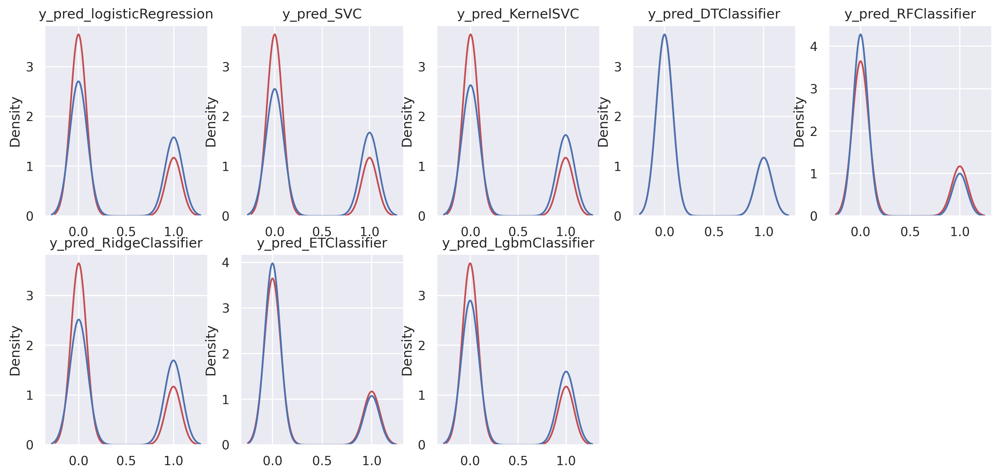

In [157]:
visualize_models(y_test,imbalanced_predictions)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

/usr/local/li

<Figure size 1500x2400 with 0 Axes>

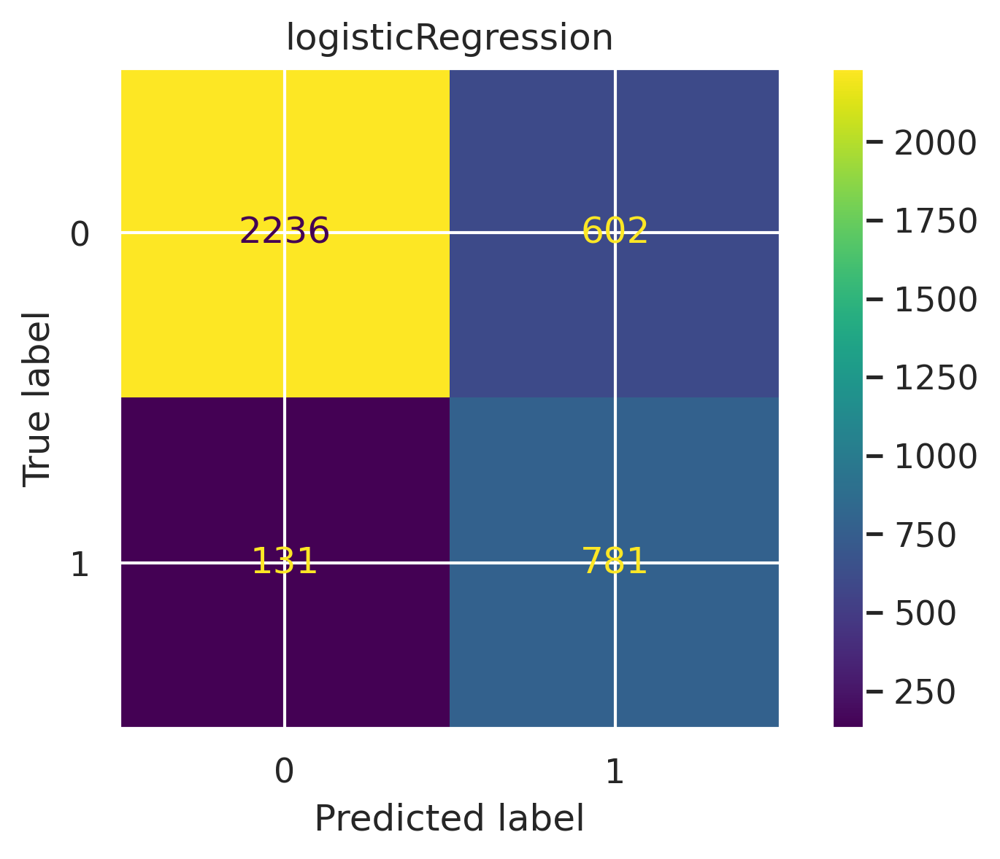

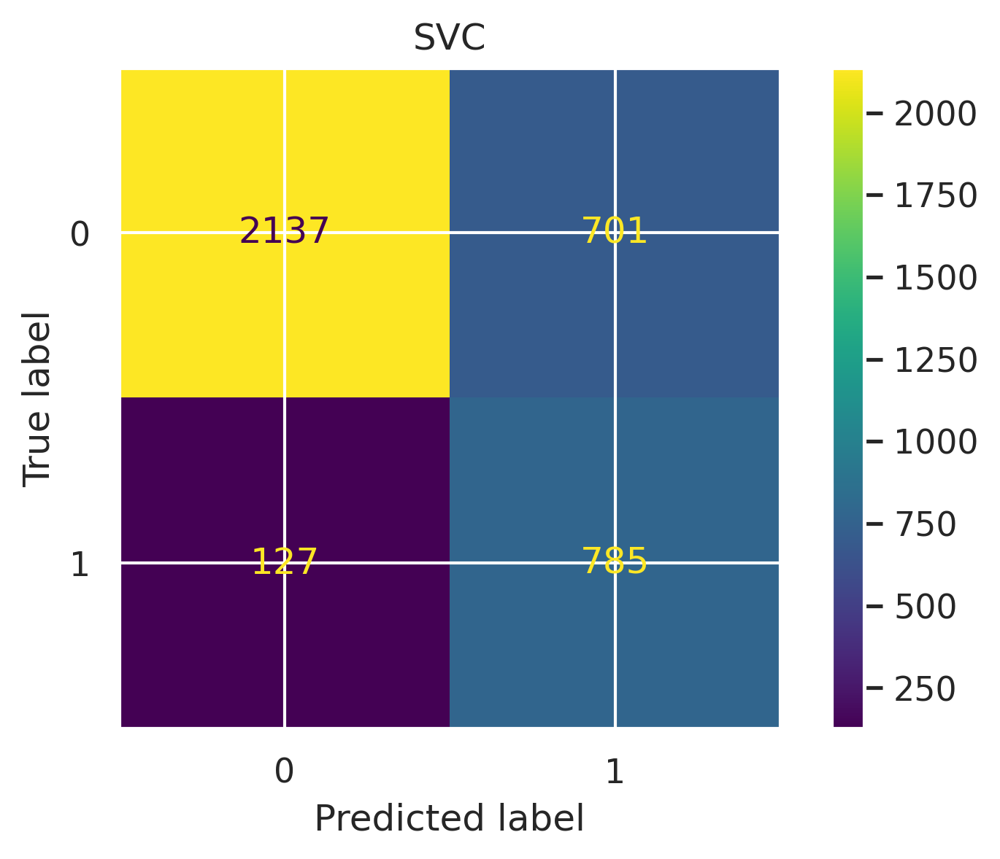

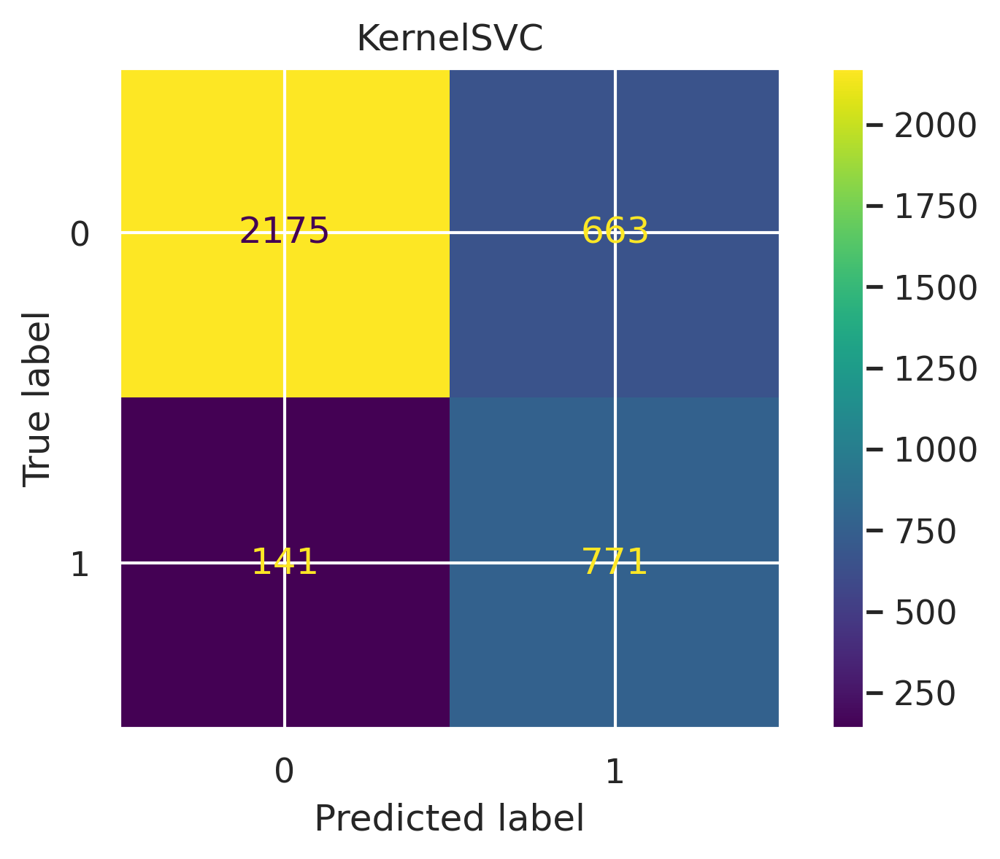

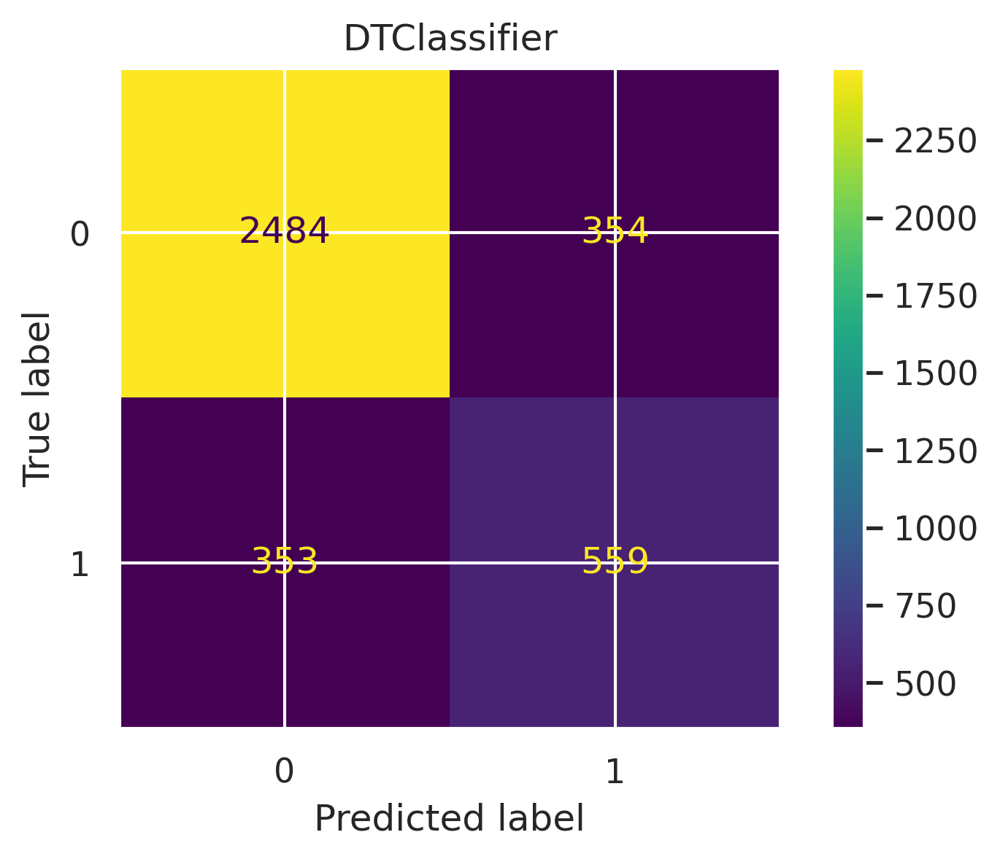

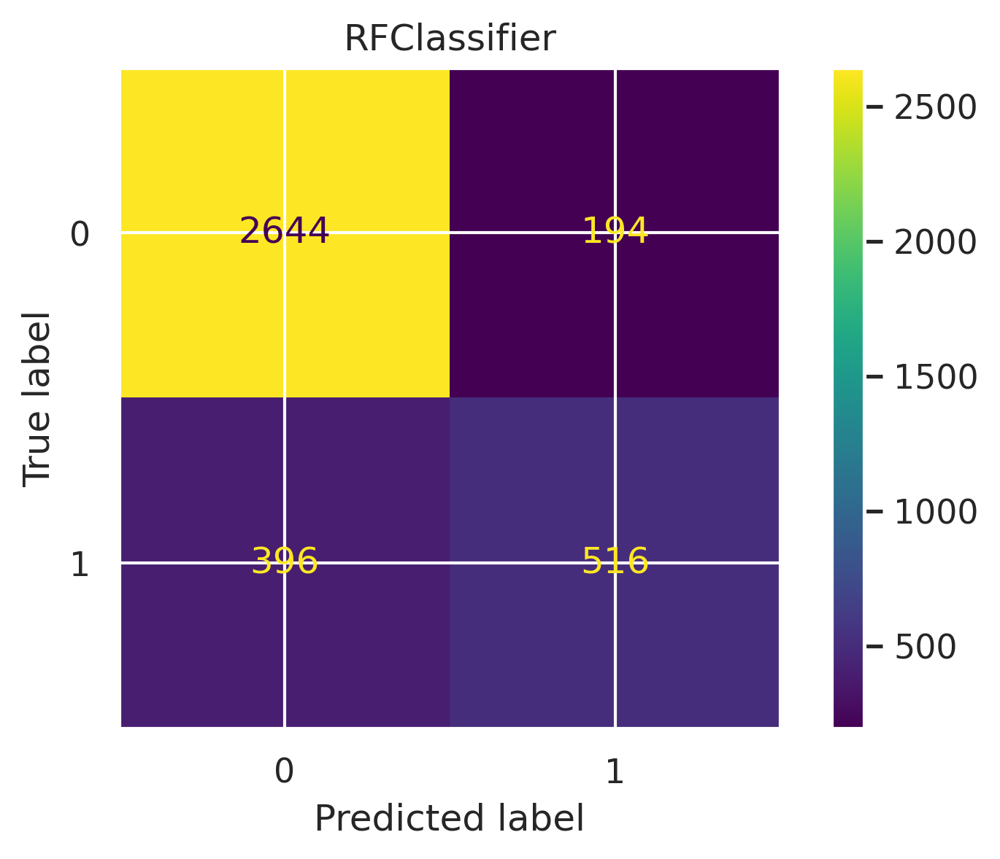

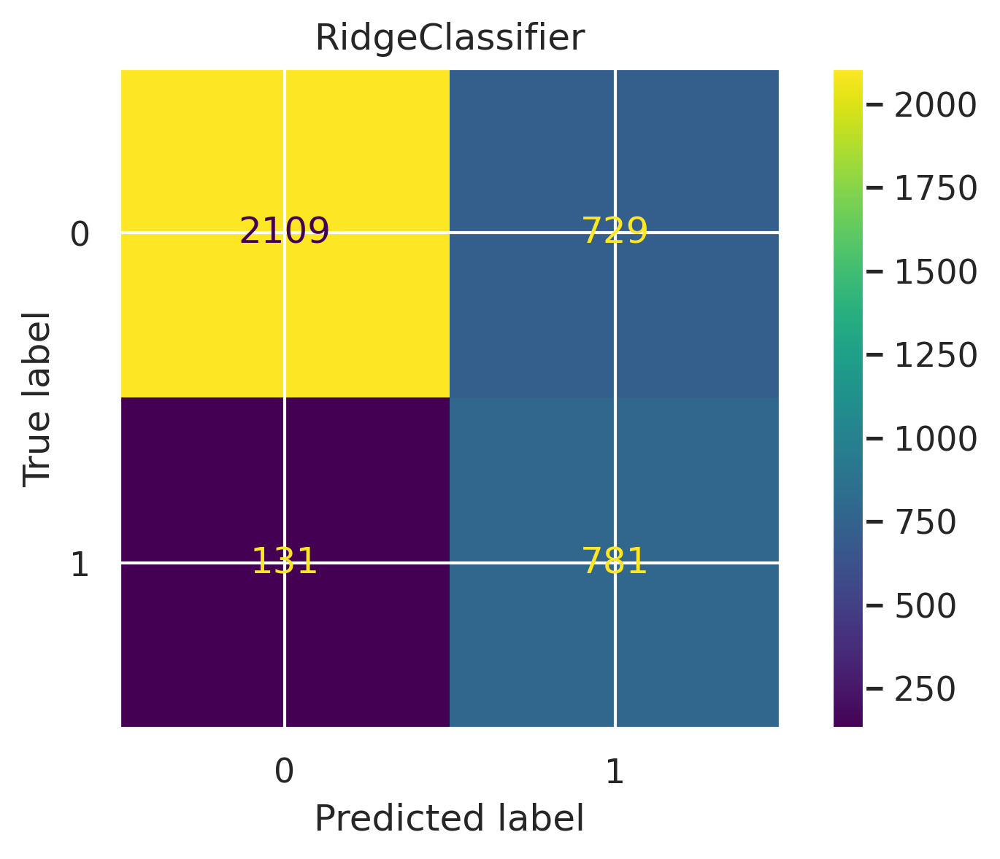

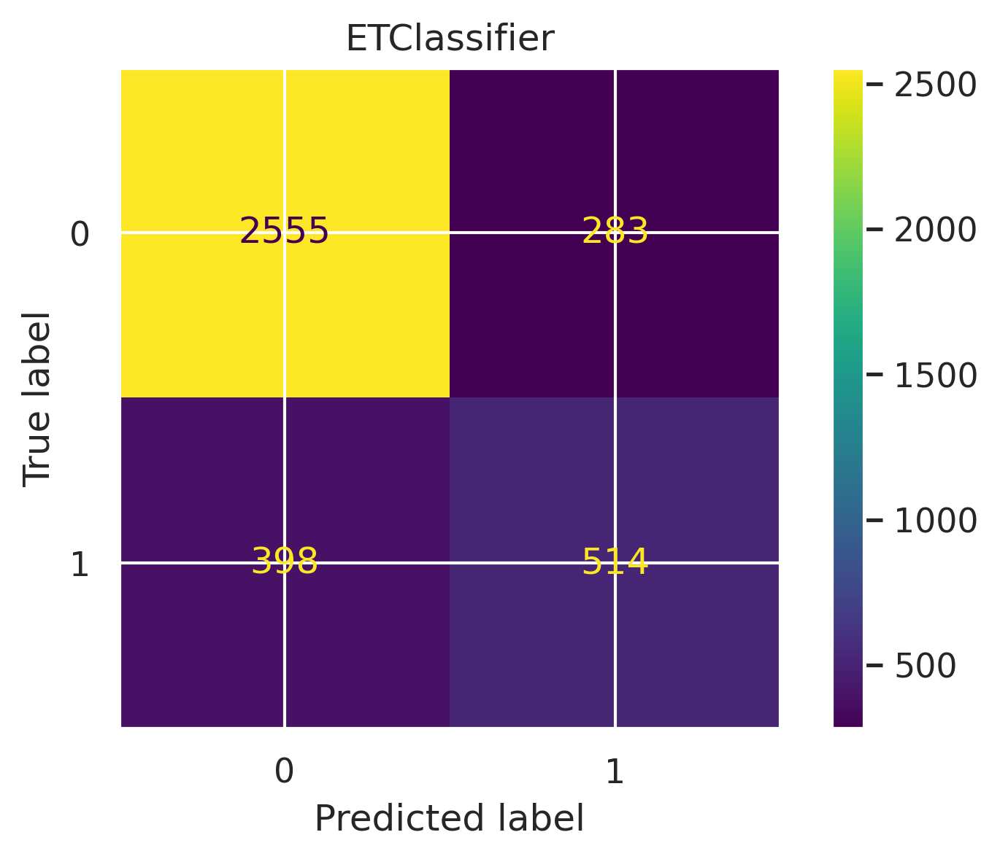

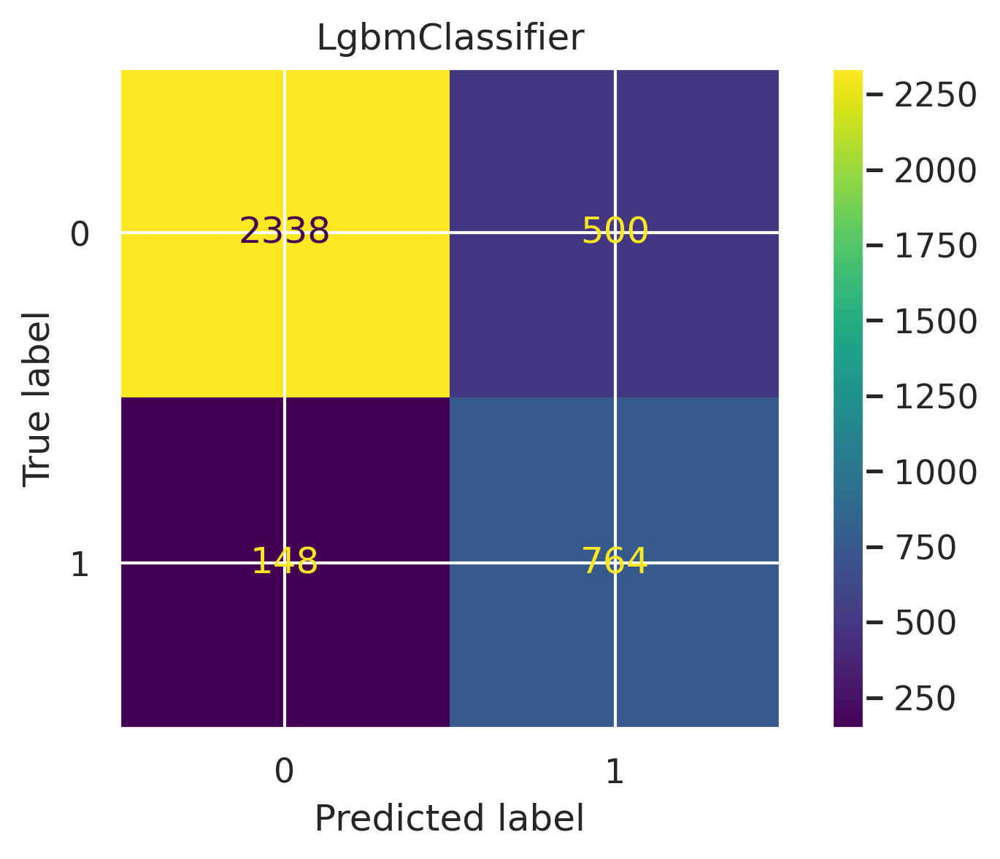

In [158]:
prepare_confusion_matrix(imblancedModels)

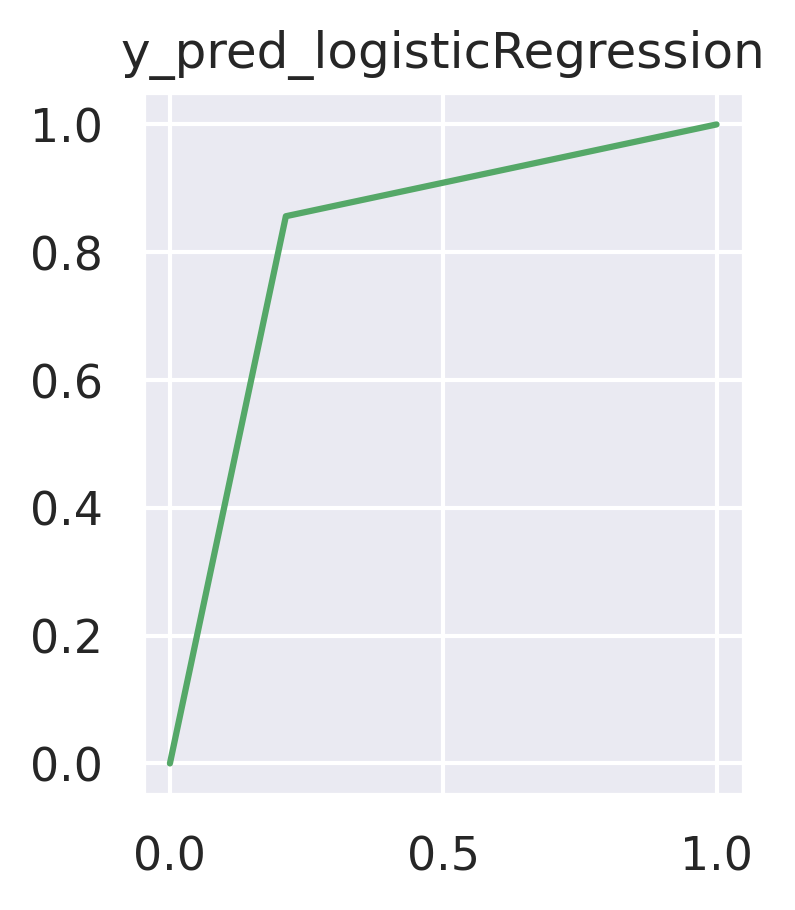

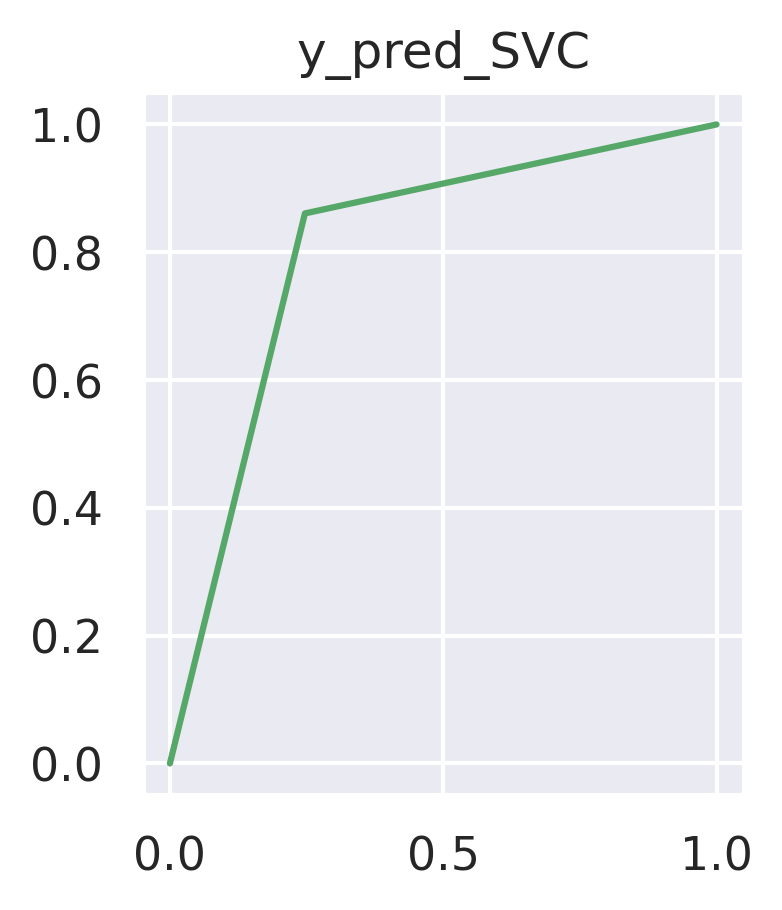

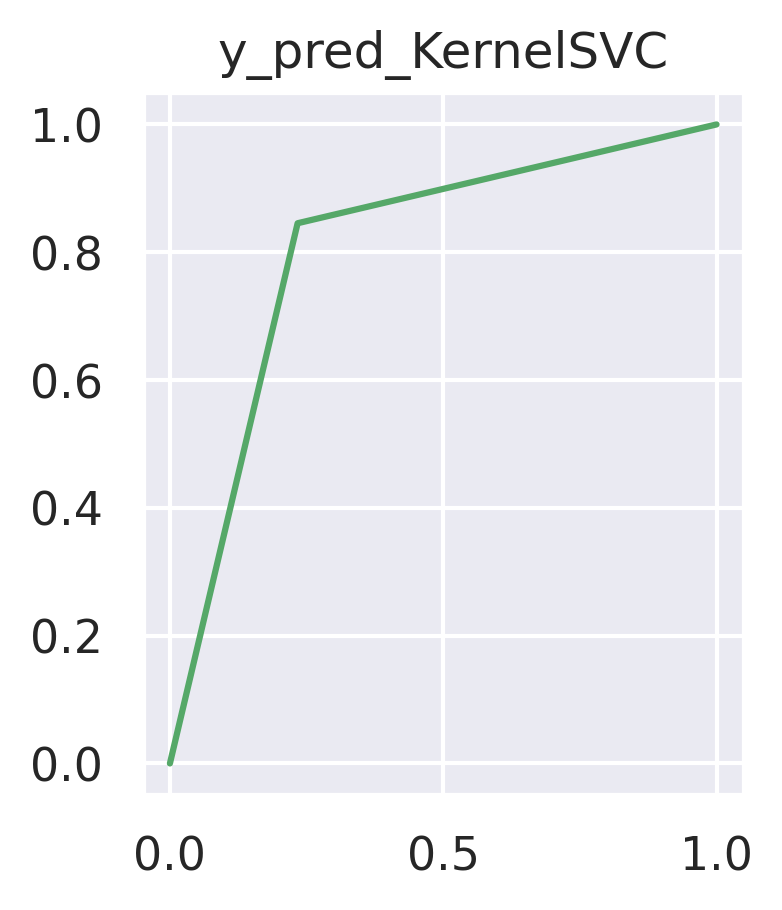

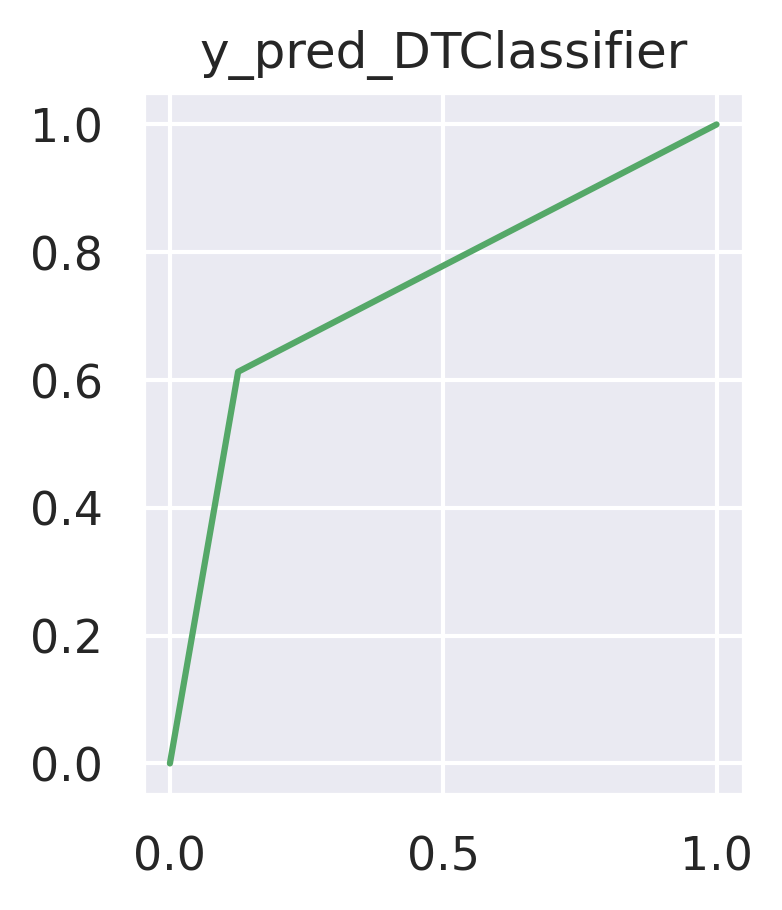

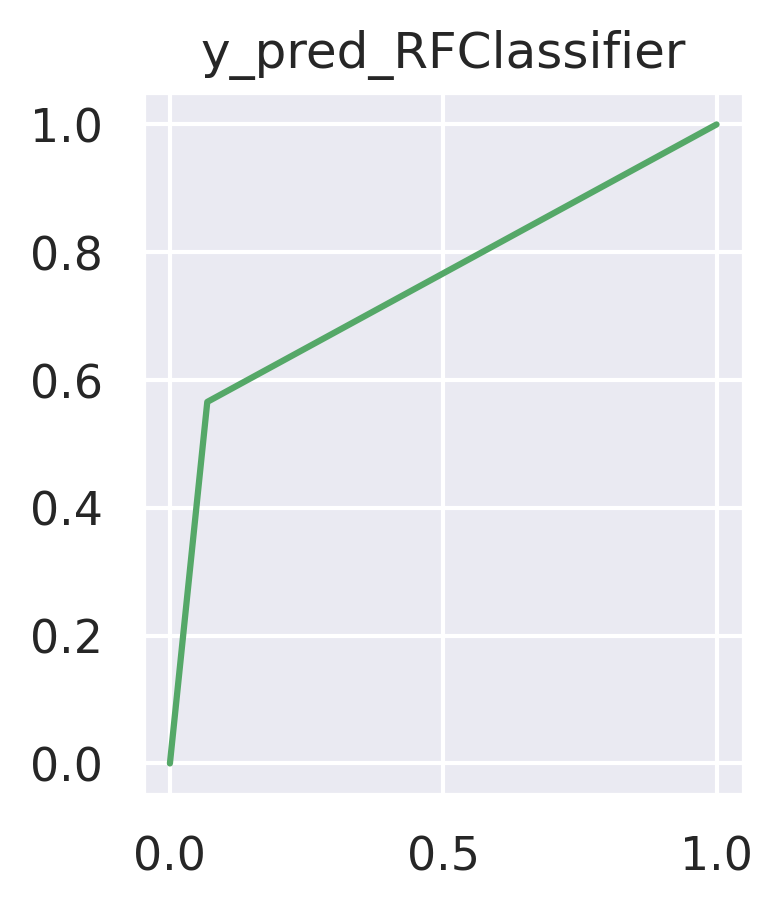

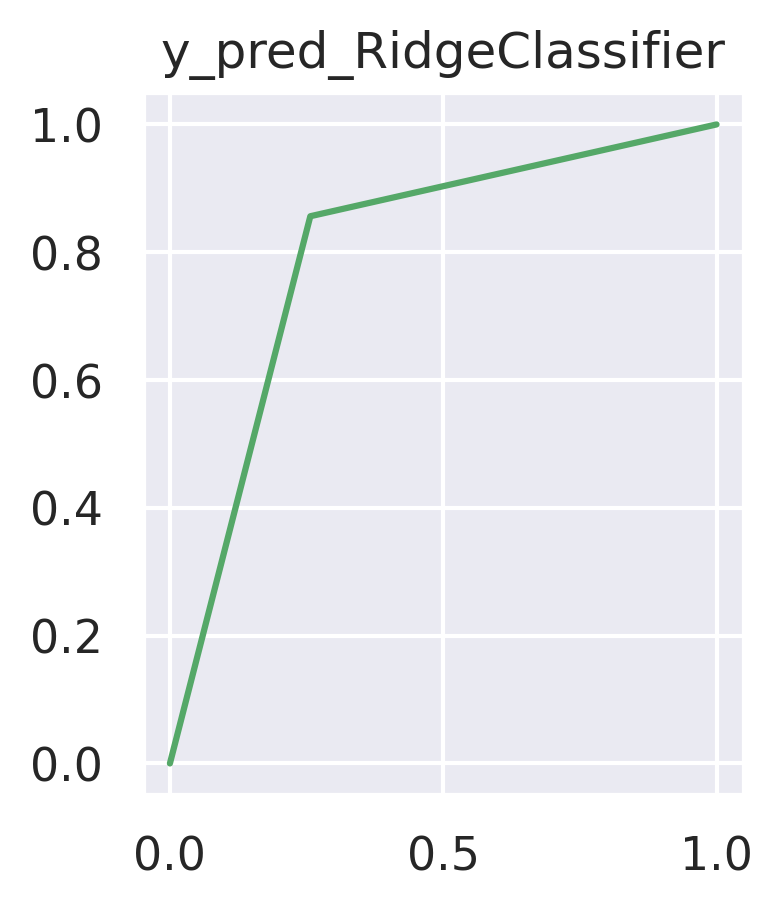

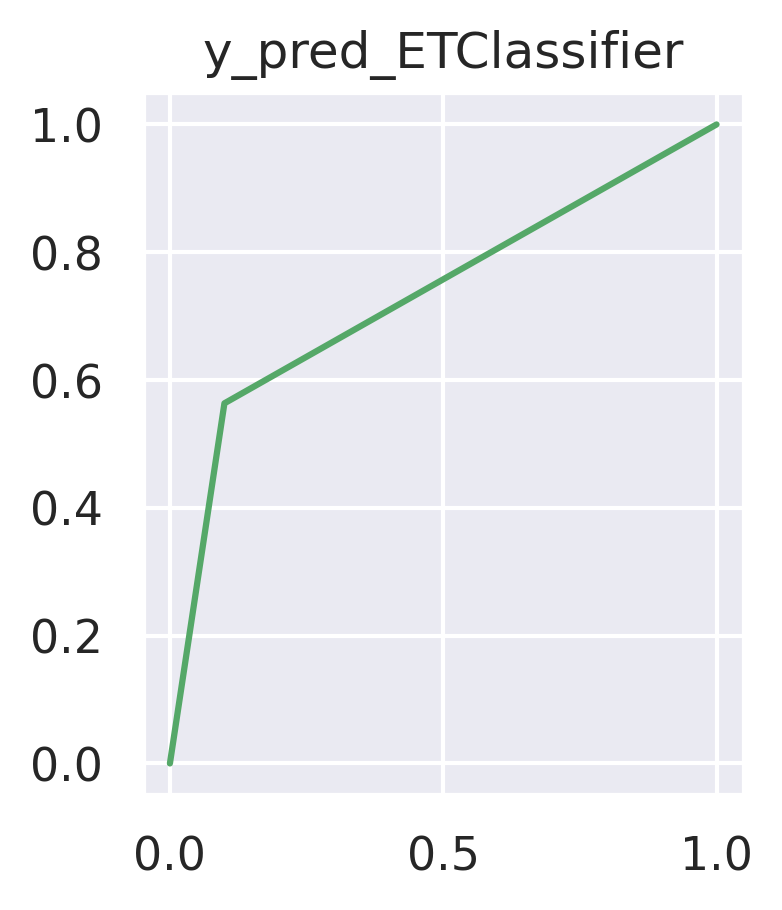

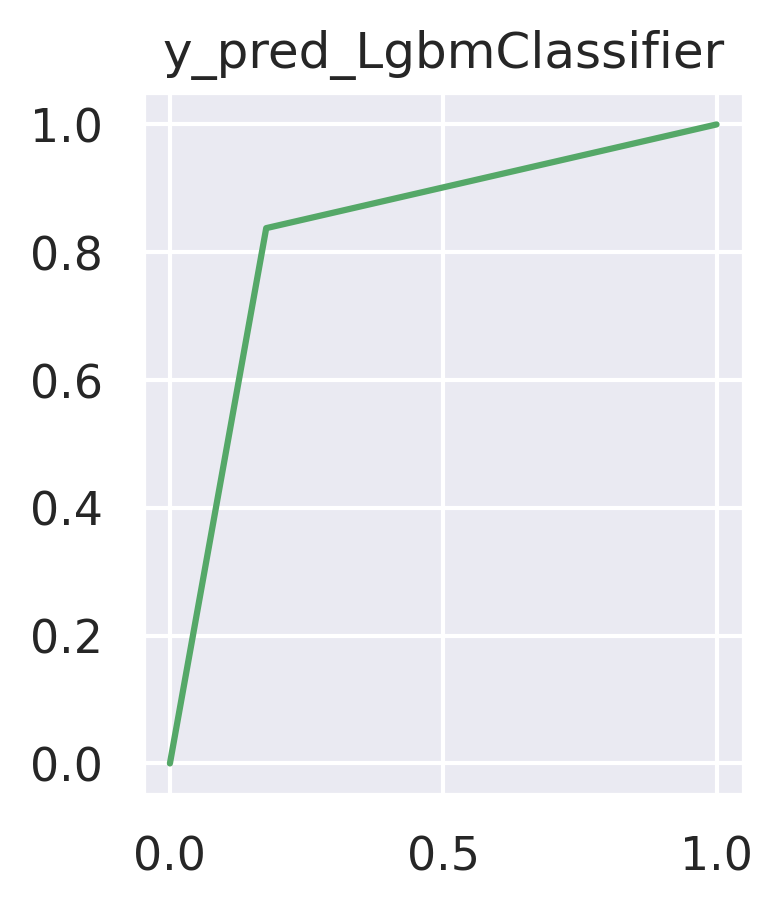

In [159]:
ROC_Curve(imbalanced_predictions)

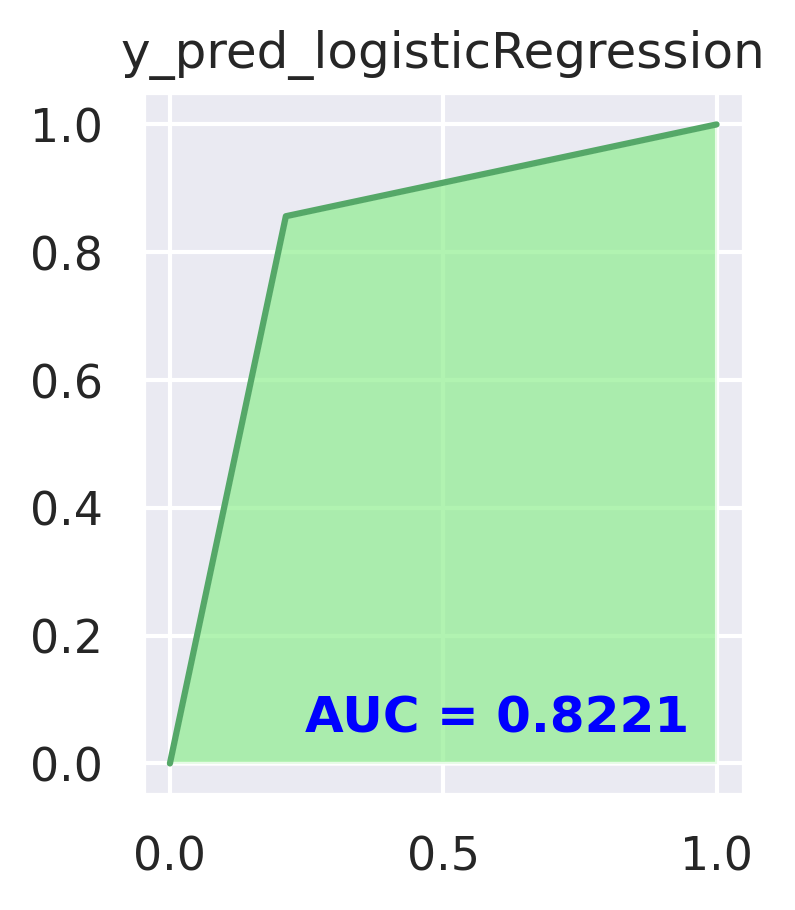

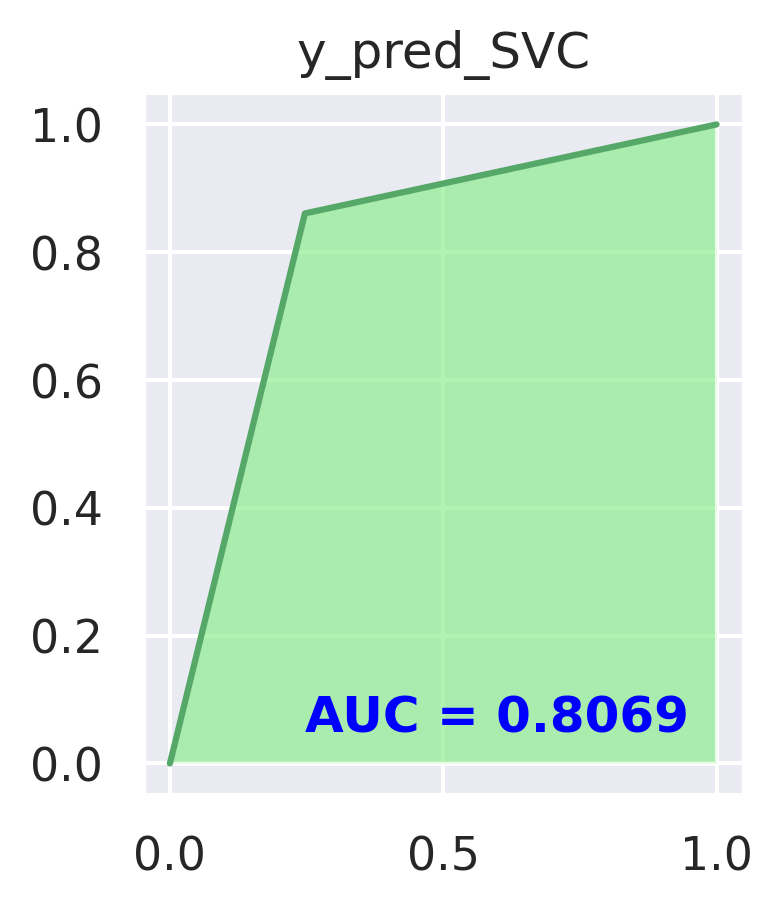

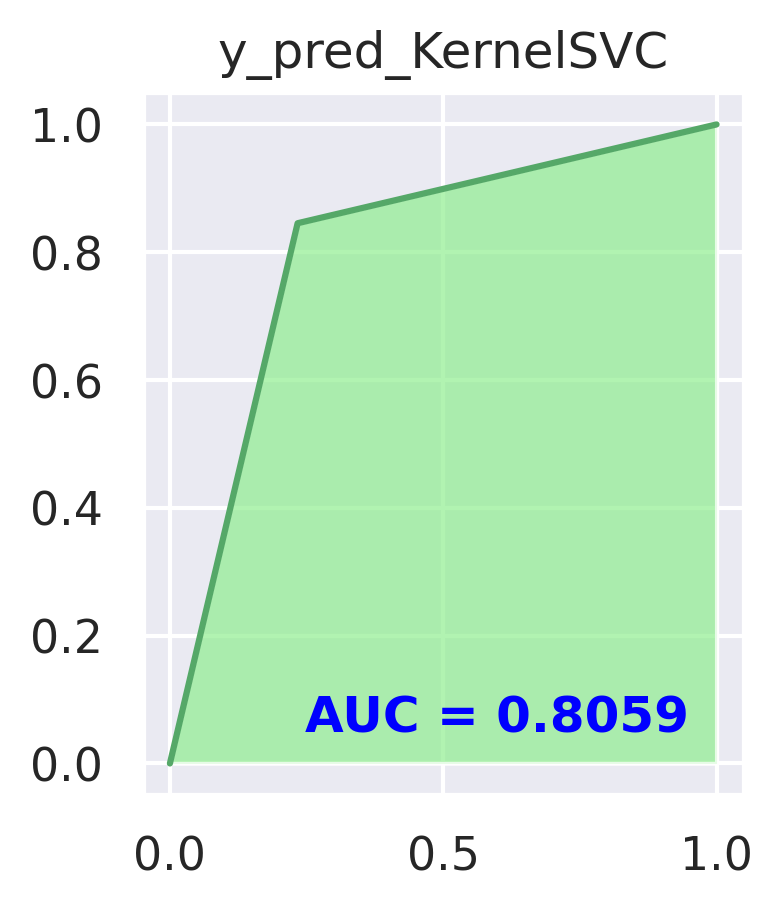

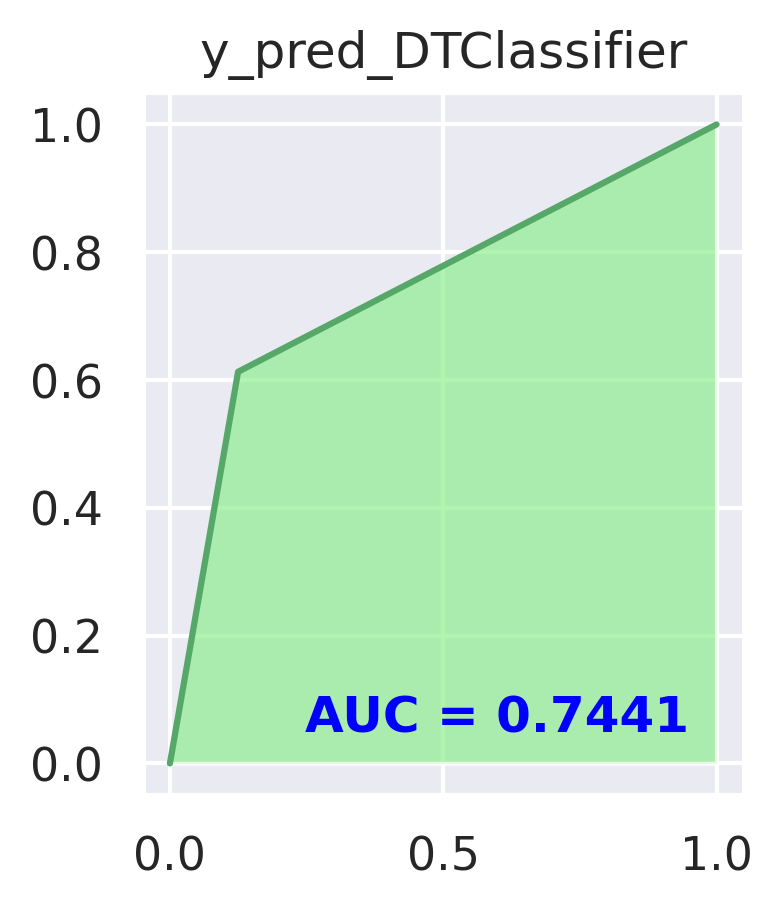

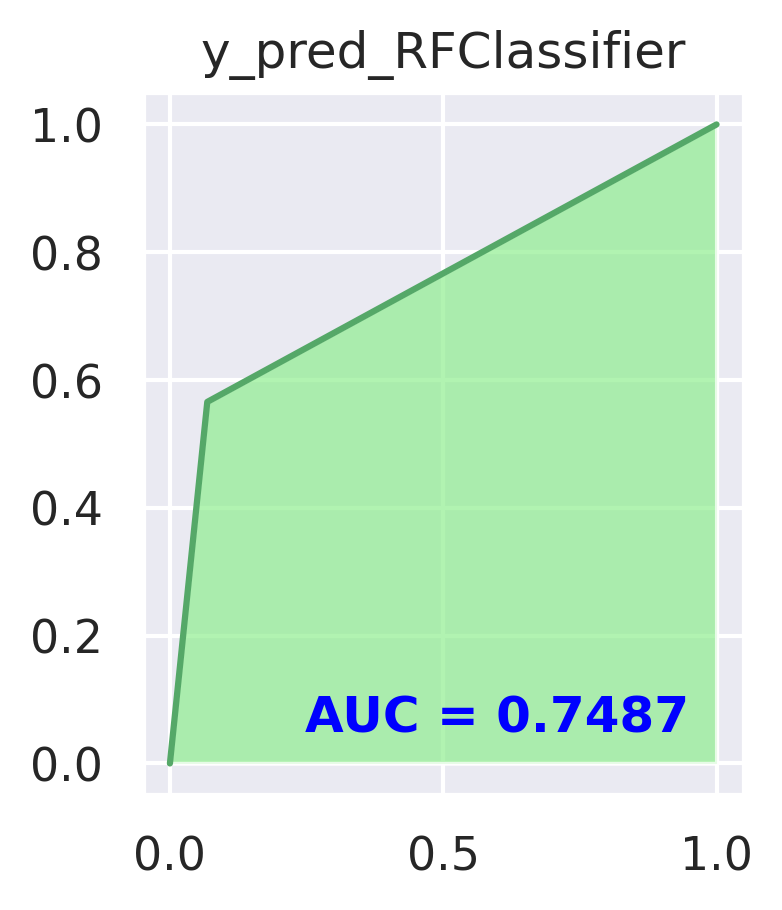

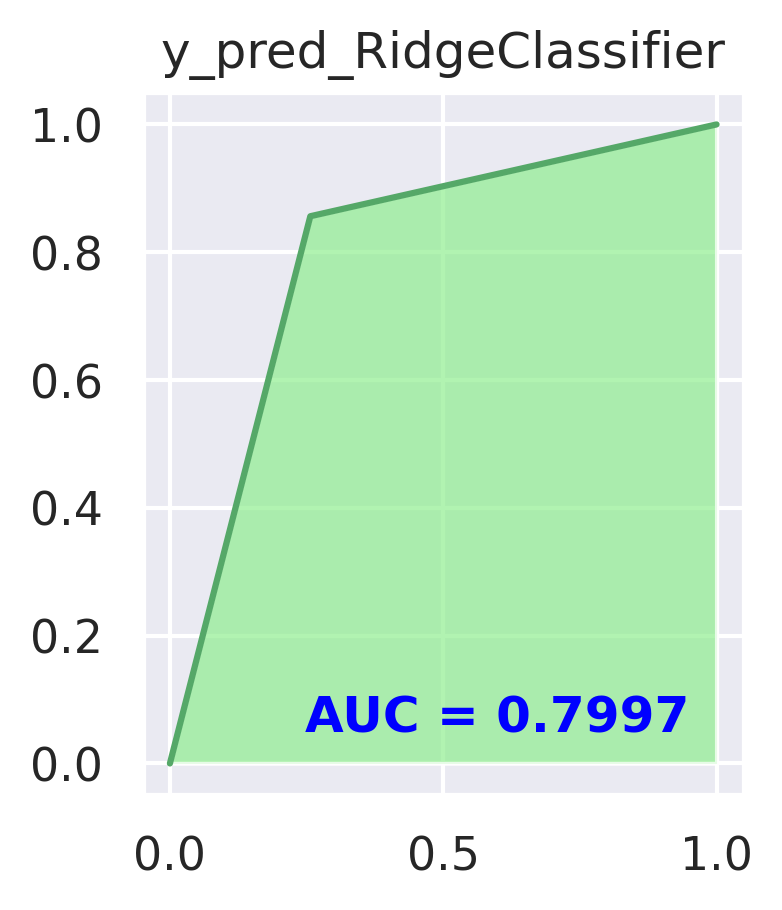

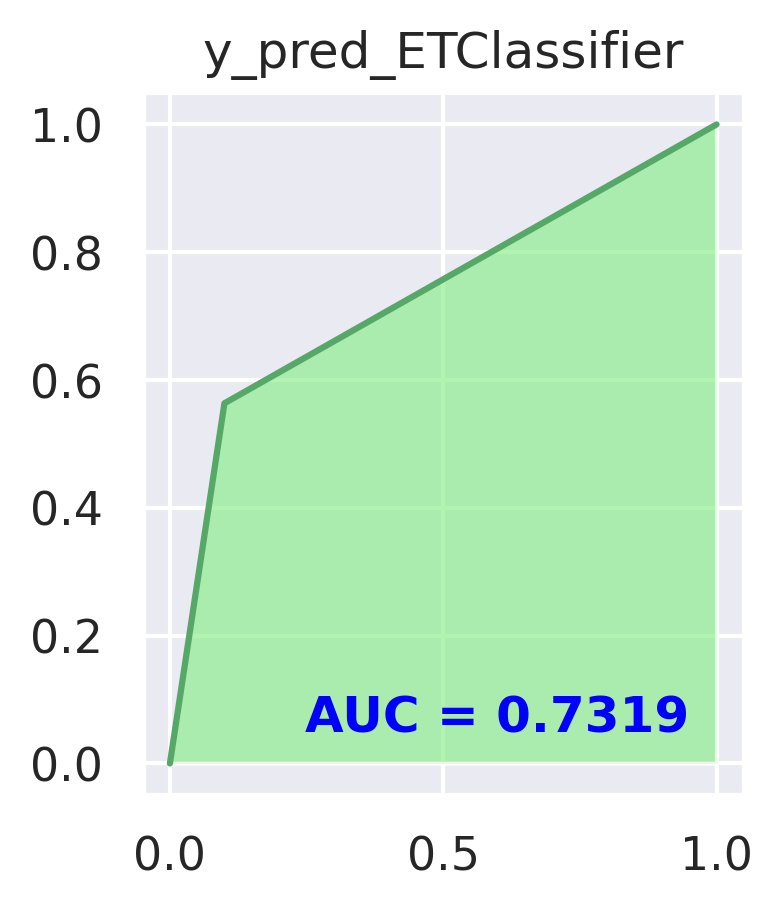

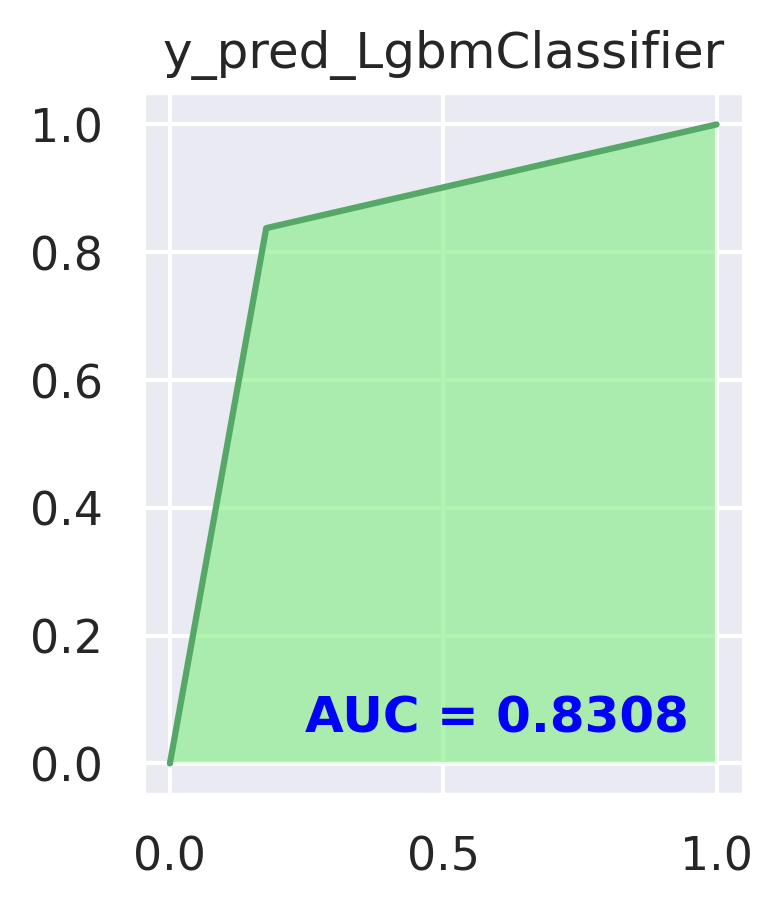

In [160]:
AUC_curve(imbalanced_predictions)

In [161]:
imbalanced_scores = matric_evaluation_of_models(imblancedModels)

In [162]:
ImbalncedDataFrameScores = prepare_df_model_evaluation(imbalanced_scores)

In [163]:
display(ImbalncedDataFrameScores)

,model,accuracy,auc,f1,precision,recall
7,LgbmClassifier,0.828800,0.920413,0.698031,0.601977,0.831821
0,logisticRegression,0.802756,0.899594,0.670542,0.556963,0.843057
1,SVC,0.780711,0.893913,0.650438,0.524136,0.857240
2,KernelSVC,0.785156,0.888150,0.647642,0.531242,0.829951
5,RidgeClassifier,0.775200,0.887467,0.646477,0.516896,0.863591
4,RFClassifier,0.844444,0.871608,0.629049,0.727510,0.554928
3,DTClassifier,0.813778,0.746976,0.612372,0.606432,0.619564
6,ETClassifier,0.826044,0.870392,0.607739,0.656236,0.567625


In [164]:
imblanced_confusion_score = get_confusion_params(imbalanced_predictions)

In [165]:
imbalancedSpecificitySenstivity = specificity_senstivity(imblanced_confusion_score)

In [168]:
for val in imbalancedSpecificitySenstivity:
  print(f'{val} => {imbalancedSpecificitySenstivity[val]}')

y_pred_logisticRegression => {'specificity': 0.7878787878787878, 'senstivity': 2.4517543859649122}
y_pred_SVC => {'specificity': 0.7529950669485553, 'senstivity': 2.343201754385965}
y_pred_KernelSVC => {'specificity': 0.766384778012685, 'senstivity': 2.3848684210526314}
y_pred_DTClassifier => {'specificity': 0.8752642706131079, 'senstivity': 2.723684210526316}
y_pred_RFClassifier => {'specificity': 0.9316420014094433, 'senstivity': 2.8991228070175437}
y_pred_RidgeClassifier => {'specificity': 0.7431289640591966, 'senstivity': 2.3125}
y_pred_ETClassifier => {'specificity': 0.9002818886539817, 'senstivity': 2.8015350877192984}
y_pred_LgbmClassifier => {'specificity': 0.8238195912614518, 'senstivity': 2.56359649122807}


#Balancing the dataset now and then runnig algos

Original dataset shape 15000
Resampled dataset shape 19708


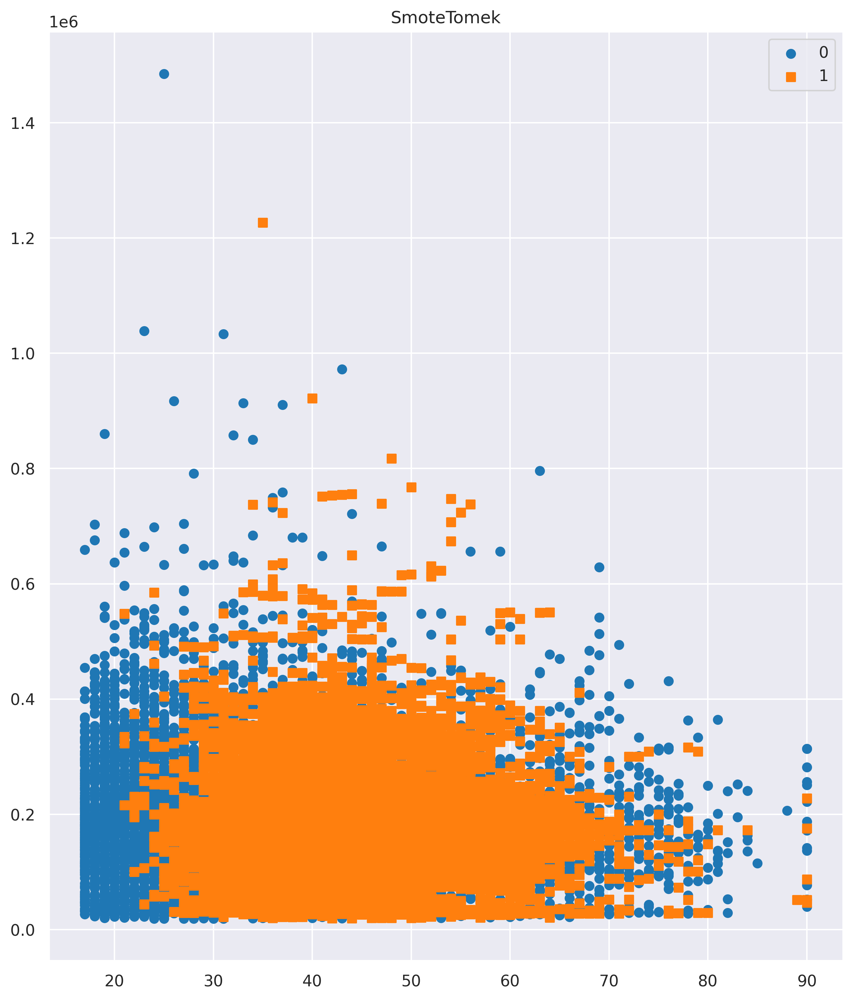

In [171]:
balancedData=hybrid(x,y)

In [174]:
xBalanced=balancedData[0]
yBalanced=balancedData[1]

In [175]:
display(xBalanced)

array([[    39,  77516,     13, ...,      1,      0,      0],
       [    50,  83311,     13, ...,      1,      0,      0],
       [    38, 215646,      9, ...,      1,      0,      0],
       ...,
       [    45, 226321,     12, ...,      0,      0,      0],
       [    41, 217735,     12, ...,      1,      0,      0],
       [    39,  82409,     10, ...,      1,      0,      0]])

In [176]:
#now generate a new data frame from this data and repeat above mentioned steps

array([0, 0, 0, ..., 1, 1, 1])